# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

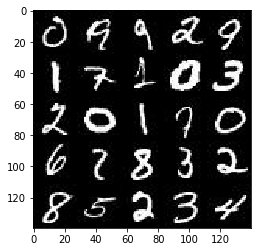

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

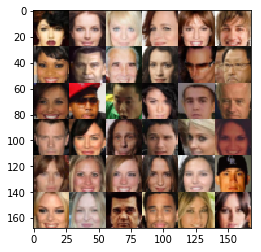

In [4]:
show_n_images = 36

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name='input_real')
    input_z = tf.placeholder(tf.float32, [None, z_dim], name='input_z')
    in_learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return input_real, input_z, in_learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [8]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha=0.2
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x128 now
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14x14x64 now
        
        x4 = tf.layers.conv2d_transpose(x3, 32, 5, strides=2, padding='same')
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.maximum(alpha * x4, x4)
        # 28x28x32 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28x28xout_channel_dim now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    alpha = 0.2
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
   # TODO: Build Model
    _,image_width,image_height,image_channels = data_shape
    
    input_real,input_z,lr = model_inputs(image_width,image_height,image_channels,z_dim)
    d_loss,g_loss = model_loss(input_real,input_z,image_channels)
    d_opt,g_opt = model_opt(d_loss,g_loss,lr,beta1)
    
    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images *= 2
                batch_z = np.random.uniform(-1, 1, size = (batch_size, z_dim))
                sess.run(d_opt, feed_dict={input_real: batch_images,
                                              input_z: batch_z,
                                              lr: learning_rate})
                sess.run(g_opt, feed_dict={input_real: batch_images,
                                             input_z: batch_z,
                                             lr: learning_rate})            
                if steps % 10 == 0:
                    d_loss_train = d_loss.eval({input_z: batch_z,input_real: batch_images})
                    g_loss_train = g_loss.eval({input_z: batch_z})
                    print("Epoch{}/{}".format(epoch_i + 1, epoch_count),
                          "Steps{}".format(steps),
                         "Discrimainator Loss: {:.4f}".format(d_loss_train),
                         "Generator Loss: {:.4f}".format(g_loss_train))
                if steps % 100 == 0:
                    show_generator_output(sess,50,input_z,image_channels,data_image_mode)

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch1/2 Steps10 Discrimainator Loss: 0.9962 Generator Loss: 0.5452
Epoch1/2 Steps20 Discrimainator Loss: 0.4739 Generator Loss: 1.1879
Epoch1/2 Steps30 Discrimainator Loss: 0.4444 Generator Loss: 1.2515
Epoch1/2 Steps40 Discrimainator Loss: 0.2246 Generator Loss: 4.3551
Epoch1/2 Steps50 Discrimainator Loss: 2.4046 Generator Loss: 0.1172
Epoch1/2 Steps60 Discrimainator Loss: 1.4168 Generator Loss: 0.3189
Epoch1/2 Steps70 Discrimainator Loss: 0.5547 Generator Loss: 1.2823
Epoch1/2 Steps80 Discrimainator Loss: 0.4196 Generator Loss: 1.3708
Epoch1/2 Steps90 Discrimainator Loss: 0.1392 Generator Loss: 3.1662
Epoch1/2 Steps100 Discrimainator Loss: 0.4374 Generator Loss: 1.3461


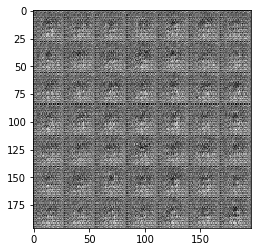

Epoch1/2 Steps110 Discrimainator Loss: 0.1353 Generator Loss: 3.7953
Epoch1/2 Steps120 Discrimainator Loss: 0.2110 Generator Loss: 3.2273
Epoch1/2 Steps130 Discrimainator Loss: 0.2701 Generator Loss: 1.8834
Epoch1/2 Steps140 Discrimainator Loss: 0.5057 Generator Loss: 4.2405
Epoch1/2 Steps150 Discrimainator Loss: 0.3209 Generator Loss: 2.1755
Epoch1/2 Steps160 Discrimainator Loss: 1.1397 Generator Loss: 0.5262
Epoch1/2 Steps170 Discrimainator Loss: 0.8121 Generator Loss: 0.7336
Epoch1/2 Steps180 Discrimainator Loss: 0.7546 Generator Loss: 1.0347
Epoch1/2 Steps190 Discrimainator Loss: 0.6376 Generator Loss: 1.1941
Epoch1/2 Steps200 Discrimainator Loss: 0.8529 Generator Loss: 1.1085


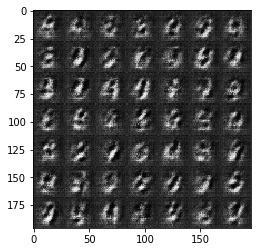

Epoch1/2 Steps210 Discrimainator Loss: 0.8965 Generator Loss: 3.0309
Epoch1/2 Steps220 Discrimainator Loss: 0.5509 Generator Loss: 1.6642
Epoch1/2 Steps230 Discrimainator Loss: 0.6131 Generator Loss: 2.6131
Epoch1/2 Steps240 Discrimainator Loss: 0.5237 Generator Loss: 2.6247
Epoch1/2 Steps250 Discrimainator Loss: 1.6006 Generator Loss: 4.5186
Epoch1/2 Steps260 Discrimainator Loss: 1.6923 Generator Loss: 4.2213
Epoch1/2 Steps270 Discrimainator Loss: 1.1149 Generator Loss: 2.8658
Epoch1/2 Steps280 Discrimainator Loss: 0.4677 Generator Loss: 2.1452
Epoch1/2 Steps290 Discrimainator Loss: 0.5986 Generator Loss: 3.0115
Epoch1/2 Steps300 Discrimainator Loss: 1.3651 Generator Loss: 0.5160


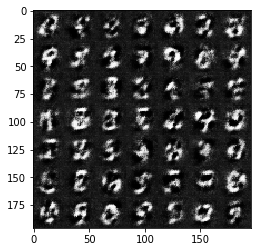

Epoch1/2 Steps310 Discrimainator Loss: 0.9045 Generator Loss: 0.6294
Epoch1/2 Steps320 Discrimainator Loss: 0.5753 Generator Loss: 1.1369
Epoch1/2 Steps330 Discrimainator Loss: 1.1392 Generator Loss: 3.2181
Epoch1/2 Steps340 Discrimainator Loss: 0.4517 Generator Loss: 1.6272
Epoch1/2 Steps350 Discrimainator Loss: 0.4162 Generator Loss: 1.6078
Epoch1/2 Steps360 Discrimainator Loss: 0.7253 Generator Loss: 0.8581
Epoch1/2 Steps370 Discrimainator Loss: 0.8303 Generator Loss: 0.6804
Epoch1/2 Steps380 Discrimainator Loss: 0.4751 Generator Loss: 1.4590
Epoch1/2 Steps390 Discrimainator Loss: 1.4841 Generator Loss: 4.7665
Epoch1/2 Steps400 Discrimainator Loss: 0.4802 Generator Loss: 1.3063


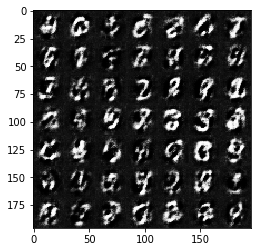

Epoch1/2 Steps410 Discrimainator Loss: 0.4189 Generator Loss: 1.6158
Epoch1/2 Steps420 Discrimainator Loss: 0.7004 Generator Loss: 0.8337
Epoch1/2 Steps430 Discrimainator Loss: 0.5860 Generator Loss: 1.1075
Epoch1/2 Steps440 Discrimainator Loss: 0.5816 Generator Loss: 0.9978
Epoch1/2 Steps450 Discrimainator Loss: 0.4492 Generator Loss: 1.5577
Epoch1/2 Steps460 Discrimainator Loss: 2.1235 Generator Loss: 0.1509
Epoch1/2 Steps470 Discrimainator Loss: 0.3926 Generator Loss: 1.5259
Epoch1/2 Steps480 Discrimainator Loss: 0.4283 Generator Loss: 2.2612
Epoch1/2 Steps490 Discrimainator Loss: 1.9498 Generator Loss: 4.2812
Epoch1/2 Steps500 Discrimainator Loss: 0.4073 Generator Loss: 1.6081


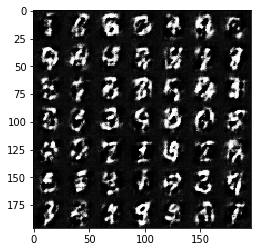

Epoch1/2 Steps510 Discrimainator Loss: 0.4749 Generator Loss: 1.5777
Epoch1/2 Steps520 Discrimainator Loss: 0.8926 Generator Loss: 3.6222
Epoch1/2 Steps530 Discrimainator Loss: 0.5229 Generator Loss: 1.1505
Epoch1/2 Steps540 Discrimainator Loss: 0.4981 Generator Loss: 3.7274
Epoch1/2 Steps550 Discrimainator Loss: 0.7821 Generator Loss: 2.9201
Epoch1/2 Steps560 Discrimainator Loss: 0.5209 Generator Loss: 1.2263
Epoch1/2 Steps570 Discrimainator Loss: 0.4568 Generator Loss: 1.5707
Epoch1/2 Steps580 Discrimainator Loss: 0.6489 Generator Loss: 0.9363
Epoch1/2 Steps590 Discrimainator Loss: 1.0061 Generator Loss: 0.6008
Epoch1/2 Steps600 Discrimainator Loss: 1.0130 Generator Loss: 0.5476


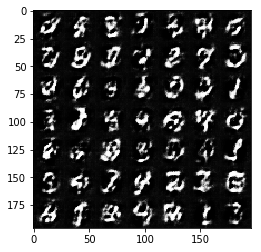

Epoch1/2 Steps610 Discrimainator Loss: 0.6827 Generator Loss: 0.9682
Epoch1/2 Steps620 Discrimainator Loss: 0.4704 Generator Loss: 1.8804
Epoch1/2 Steps630 Discrimainator Loss: 0.7854 Generator Loss: 0.8361
Epoch1/2 Steps640 Discrimainator Loss: 0.4236 Generator Loss: 1.4668
Epoch1/2 Steps650 Discrimainator Loss: 0.9502 Generator Loss: 3.6779
Epoch1/2 Steps660 Discrimainator Loss: 0.5158 Generator Loss: 1.2260
Epoch1/2 Steps670 Discrimainator Loss: 0.4709 Generator Loss: 2.4312
Epoch1/2 Steps680 Discrimainator Loss: 1.0112 Generator Loss: 4.5840
Epoch1/2 Steps690 Discrimainator Loss: 0.5497 Generator Loss: 1.2811
Epoch1/2 Steps700 Discrimainator Loss: 0.3752 Generator Loss: 1.6084


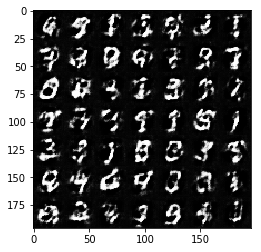

Epoch1/2 Steps710 Discrimainator Loss: 0.5463 Generator Loss: 2.2761
Epoch1/2 Steps720 Discrimainator Loss: 0.3559 Generator Loss: 2.1633
Epoch1/2 Steps730 Discrimainator Loss: 1.0959 Generator Loss: 0.4649
Epoch1/2 Steps740 Discrimainator Loss: 1.4004 Generator Loss: 4.0829
Epoch1/2 Steps750 Discrimainator Loss: 0.5199 Generator Loss: 1.2623
Epoch1/2 Steps760 Discrimainator Loss: 0.5861 Generator Loss: 1.0229
Epoch1/2 Steps770 Discrimainator Loss: 0.6640 Generator Loss: 2.9038
Epoch1/2 Steps780 Discrimainator Loss: 0.7758 Generator Loss: 2.8470
Epoch1/2 Steps790 Discrimainator Loss: 0.4956 Generator Loss: 1.4415
Epoch1/2 Steps800 Discrimainator Loss: 1.0366 Generator Loss: 0.6117


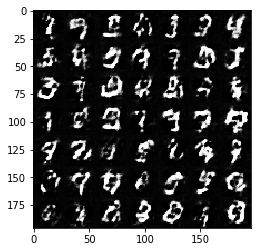

Epoch1/2 Steps810 Discrimainator Loss: 0.7346 Generator Loss: 0.8743
Epoch1/2 Steps820 Discrimainator Loss: 0.4980 Generator Loss: 1.4688
Epoch1/2 Steps830 Discrimainator Loss: 0.6181 Generator Loss: 1.0919
Epoch1/2 Steps840 Discrimainator Loss: 0.5235 Generator Loss: 3.6439
Epoch1/2 Steps850 Discrimainator Loss: 0.4374 Generator Loss: 1.6272
Epoch1/2 Steps860 Discrimainator Loss: 1.1130 Generator Loss: 0.5127
Epoch1/2 Steps870 Discrimainator Loss: 0.5798 Generator Loss: 0.9954
Epoch1/2 Steps880 Discrimainator Loss: 1.8652 Generator Loss: 0.2207
Epoch1/2 Steps890 Discrimainator Loss: 0.5971 Generator Loss: 1.1197
Epoch1/2 Steps900 Discrimainator Loss: 0.8674 Generator Loss: 0.7361


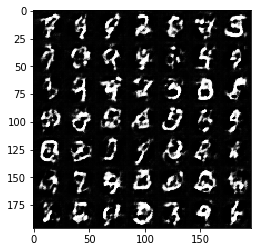

Epoch1/2 Steps910 Discrimainator Loss: 0.9662 Generator Loss: 0.7015
Epoch1/2 Steps920 Discrimainator Loss: 0.8118 Generator Loss: 0.8089
Epoch1/2 Steps930 Discrimainator Loss: 0.6317 Generator Loss: 1.4016
Epoch1/2 Steps940 Discrimainator Loss: 0.5091 Generator Loss: 1.3347
Epoch1/2 Steps950 Discrimainator Loss: 0.6601 Generator Loss: 2.5107
Epoch1/2 Steps960 Discrimainator Loss: 0.8371 Generator Loss: 2.4600
Epoch1/2 Steps970 Discrimainator Loss: 0.5911 Generator Loss: 1.9054
Epoch1/2 Steps980 Discrimainator Loss: 0.6897 Generator Loss: 0.9057
Epoch1/2 Steps990 Discrimainator Loss: 0.5364 Generator Loss: 1.4236
Epoch1/2 Steps1000 Discrimainator Loss: 0.6740 Generator Loss: 2.0360


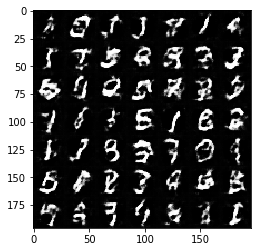

Epoch1/2 Steps1010 Discrimainator Loss: 0.5373 Generator Loss: 1.8902
Epoch1/2 Steps1020 Discrimainator Loss: 1.4468 Generator Loss: 0.3582
Epoch1/2 Steps1030 Discrimainator Loss: 0.7042 Generator Loss: 2.1192
Epoch1/2 Steps1040 Discrimainator Loss: 0.6155 Generator Loss: 1.0142
Epoch1/2 Steps1050 Discrimainator Loss: 0.5977 Generator Loss: 1.3904
Epoch1/2 Steps1060 Discrimainator Loss: 0.7944 Generator Loss: 1.1876
Epoch1/2 Steps1070 Discrimainator Loss: 0.7261 Generator Loss: 2.4134
Epoch1/2 Steps1080 Discrimainator Loss: 0.5939 Generator Loss: 1.9586
Epoch1/2 Steps1090 Discrimainator Loss: 0.6791 Generator Loss: 2.7835
Epoch1/2 Steps1100 Discrimainator Loss: 0.7126 Generator Loss: 0.9124


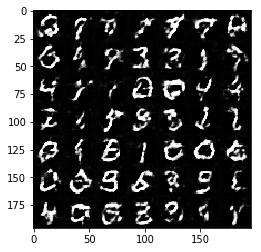

Epoch1/2 Steps1110 Discrimainator Loss: 0.9505 Generator Loss: 0.6445
Epoch1/2 Steps1120 Discrimainator Loss: 0.7085 Generator Loss: 1.0016
Epoch1/2 Steps1130 Discrimainator Loss: 0.9283 Generator Loss: 0.6376
Epoch1/2 Steps1140 Discrimainator Loss: 1.2847 Generator Loss: 2.8158
Epoch1/2 Steps1150 Discrimainator Loss: 0.6145 Generator Loss: 1.3265
Epoch1/2 Steps1160 Discrimainator Loss: 0.6458 Generator Loss: 1.1128
Epoch1/2 Steps1170 Discrimainator Loss: 0.5355 Generator Loss: 1.3685
Epoch1/2 Steps1180 Discrimainator Loss: 0.7984 Generator Loss: 0.7740
Epoch1/2 Steps1190 Discrimainator Loss: 1.8310 Generator Loss: 0.2207
Epoch1/2 Steps1200 Discrimainator Loss: 0.7391 Generator Loss: 0.8535


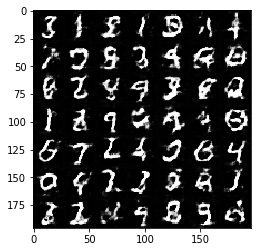

Epoch1/2 Steps1210 Discrimainator Loss: 0.7899 Generator Loss: 0.8845
Epoch1/2 Steps1220 Discrimainator Loss: 0.8459 Generator Loss: 2.5176
Epoch1/2 Steps1230 Discrimainator Loss: 0.5719 Generator Loss: 1.9751
Epoch1/2 Steps1240 Discrimainator Loss: 1.0474 Generator Loss: 0.5469
Epoch1/2 Steps1250 Discrimainator Loss: 1.0911 Generator Loss: 0.5728
Epoch1/2 Steps1260 Discrimainator Loss: 1.0815 Generator Loss: 0.5148
Epoch1/2 Steps1270 Discrimainator Loss: 0.8963 Generator Loss: 0.6706
Epoch1/2 Steps1280 Discrimainator Loss: 0.4931 Generator Loss: 1.4194
Epoch1/2 Steps1290 Discrimainator Loss: 0.9397 Generator Loss: 0.7058
Epoch1/2 Steps1300 Discrimainator Loss: 1.0206 Generator Loss: 0.6023


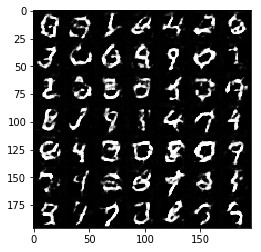

Epoch1/2 Steps1310 Discrimainator Loss: 0.8831 Generator Loss: 0.6800
Epoch1/2 Steps1320 Discrimainator Loss: 0.6224 Generator Loss: 1.2229
Epoch1/2 Steps1330 Discrimainator Loss: 0.5693 Generator Loss: 1.1188
Epoch1/2 Steps1340 Discrimainator Loss: 0.6034 Generator Loss: 1.4502
Epoch1/2 Steps1350 Discrimainator Loss: 0.6695 Generator Loss: 1.1505
Epoch1/2 Steps1360 Discrimainator Loss: 1.5704 Generator Loss: 3.1951
Epoch1/2 Steps1370 Discrimainator Loss: 0.9141 Generator Loss: 2.1831
Epoch1/2 Steps1380 Discrimainator Loss: 0.6545 Generator Loss: 1.0402
Epoch1/2 Steps1390 Discrimainator Loss: 0.5467 Generator Loss: 1.2954
Epoch1/2 Steps1400 Discrimainator Loss: 0.5893 Generator Loss: 1.3821


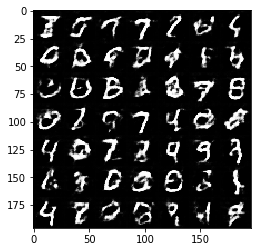

Epoch1/2 Steps1410 Discrimainator Loss: 0.6693 Generator Loss: 1.5795
Epoch1/2 Steps1420 Discrimainator Loss: 0.6718 Generator Loss: 1.0712
Epoch1/2 Steps1430 Discrimainator Loss: 1.2460 Generator Loss: 0.4788
Epoch1/2 Steps1440 Discrimainator Loss: 1.3743 Generator Loss: 0.3846
Epoch1/2 Steps1450 Discrimainator Loss: 0.9712 Generator Loss: 0.6072
Epoch1/2 Steps1460 Discrimainator Loss: 1.2274 Generator Loss: 0.4360
Epoch1/2 Steps1470 Discrimainator Loss: 0.7505 Generator Loss: 1.0935
Epoch1/2 Steps1480 Discrimainator Loss: 0.6993 Generator Loss: 1.0394
Epoch1/2 Steps1490 Discrimainator Loss: 0.7648 Generator Loss: 2.8461
Epoch1/2 Steps1500 Discrimainator Loss: 0.8282 Generator Loss: 0.7578


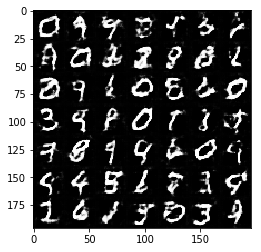

Epoch1/2 Steps1510 Discrimainator Loss: 0.6081 Generator Loss: 1.3019
Epoch1/2 Steps1520 Discrimainator Loss: 0.7400 Generator Loss: 0.9338
Epoch1/2 Steps1530 Discrimainator Loss: 2.2378 Generator Loss: 0.2054
Epoch1/2 Steps1540 Discrimainator Loss: 1.1185 Generator Loss: 0.5376
Epoch1/2 Steps1550 Discrimainator Loss: 0.8950 Generator Loss: 0.7395
Epoch1/2 Steps1560 Discrimainator Loss: 0.8917 Generator Loss: 0.6632
Epoch1/2 Steps1570 Discrimainator Loss: 1.3184 Generator Loss: 0.3742
Epoch1/2 Steps1580 Discrimainator Loss: 0.7056 Generator Loss: 0.9124
Epoch1/2 Steps1590 Discrimainator Loss: 0.7761 Generator Loss: 0.9152
Epoch1/2 Steps1600 Discrimainator Loss: 0.6636 Generator Loss: 1.2422


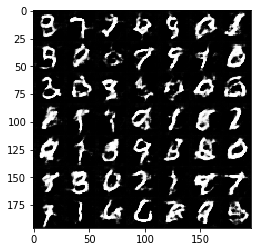

Epoch1/2 Steps1610 Discrimainator Loss: 2.3362 Generator Loss: 0.1834
Epoch1/2 Steps1620 Discrimainator Loss: 0.8062 Generator Loss: 0.8194
Epoch1/2 Steps1630 Discrimainator Loss: 0.8041 Generator Loss: 1.0361
Epoch1/2 Steps1640 Discrimainator Loss: 0.5612 Generator Loss: 1.7456
Epoch1/2 Steps1650 Discrimainator Loss: 0.7942 Generator Loss: 0.8627
Epoch1/2 Steps1660 Discrimainator Loss: 0.8607 Generator Loss: 0.7419
Epoch1/2 Steps1670 Discrimainator Loss: 0.6405 Generator Loss: 1.0120
Epoch1/2 Steps1680 Discrimainator Loss: 1.9198 Generator Loss: 0.2367
Epoch1/2 Steps1690 Discrimainator Loss: 0.7284 Generator Loss: 0.8998
Epoch1/2 Steps1700 Discrimainator Loss: 0.9332 Generator Loss: 0.6616


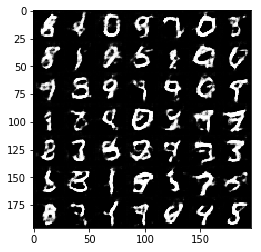

Epoch1/2 Steps1710 Discrimainator Loss: 0.6372 Generator Loss: 1.1140
Epoch1/2 Steps1720 Discrimainator Loss: 0.6457 Generator Loss: 1.0520
Epoch1/2 Steps1730 Discrimainator Loss: 0.8458 Generator Loss: 0.6801
Epoch1/2 Steps1740 Discrimainator Loss: 0.7617 Generator Loss: 0.9129
Epoch1/2 Steps1750 Discrimainator Loss: 1.1444 Generator Loss: 0.5439
Epoch1/2 Steps1760 Discrimainator Loss: 1.1024 Generator Loss: 0.5220
Epoch1/2 Steps1770 Discrimainator Loss: 0.7817 Generator Loss: 0.7728
Epoch1/2 Steps1780 Discrimainator Loss: 1.8641 Generator Loss: 0.1925
Epoch1/2 Steps1790 Discrimainator Loss: 0.7217 Generator Loss: 0.9116
Epoch1/2 Steps1800 Discrimainator Loss: 0.8494 Generator Loss: 0.7319


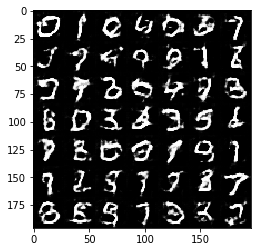

Epoch1/2 Steps1810 Discrimainator Loss: 0.7814 Generator Loss: 0.8658
Epoch1/2 Steps1820 Discrimainator Loss: 0.7677 Generator Loss: 0.8511
Epoch1/2 Steps1830 Discrimainator Loss: 0.6351 Generator Loss: 1.4353
Epoch1/2 Steps1840 Discrimainator Loss: 0.7348 Generator Loss: 2.5557
Epoch1/2 Steps1850 Discrimainator Loss: 0.6041 Generator Loss: 1.2083
Epoch1/2 Steps1860 Discrimainator Loss: 0.6915 Generator Loss: 0.9273
Epoch1/2 Steps1870 Discrimainator Loss: 0.6205 Generator Loss: 1.1965
Epoch2/2 Steps1880 Discrimainator Loss: 0.5460 Generator Loss: 1.3030
Epoch2/2 Steps1890 Discrimainator Loss: 1.1303 Generator Loss: 0.4910
Epoch2/2 Steps1900 Discrimainator Loss: 0.9463 Generator Loss: 0.6543


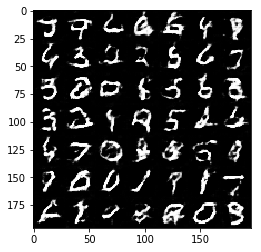

Epoch2/2 Steps1910 Discrimainator Loss: 0.8087 Generator Loss: 0.7499
Epoch2/2 Steps1920 Discrimainator Loss: 0.4761 Generator Loss: 1.4245
Epoch2/2 Steps1930 Discrimainator Loss: 1.0538 Generator Loss: 2.5910
Epoch2/2 Steps1940 Discrimainator Loss: 0.8988 Generator Loss: 0.6220
Epoch2/2 Steps1950 Discrimainator Loss: 0.8727 Generator Loss: 0.6412
Epoch2/2 Steps1960 Discrimainator Loss: 0.6402 Generator Loss: 2.4995
Epoch2/2 Steps1970 Discrimainator Loss: 0.5958 Generator Loss: 1.1436
Epoch2/2 Steps1980 Discrimainator Loss: 0.8163 Generator Loss: 0.9255
Epoch2/2 Steps1990 Discrimainator Loss: 0.5131 Generator Loss: 2.1318
Epoch2/2 Steps2000 Discrimainator Loss: 0.7568 Generator Loss: 1.7653


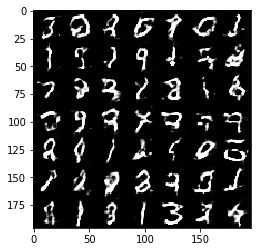

Epoch2/2 Steps2010 Discrimainator Loss: 0.7605 Generator Loss: 0.8752
Epoch2/2 Steps2020 Discrimainator Loss: 0.5349 Generator Loss: 1.0724
Epoch2/2 Steps2030 Discrimainator Loss: 2.0292 Generator Loss: 4.7435
Epoch2/2 Steps2040 Discrimainator Loss: 0.6571 Generator Loss: 1.2689
Epoch2/2 Steps2050 Discrimainator Loss: 0.8761 Generator Loss: 0.6653
Epoch2/2 Steps2060 Discrimainator Loss: 0.5356 Generator Loss: 1.2663
Epoch2/2 Steps2070 Discrimainator Loss: 0.6068 Generator Loss: 0.9446
Epoch2/2 Steps2080 Discrimainator Loss: 0.9032 Generator Loss: 0.6977
Epoch2/2 Steps2090 Discrimainator Loss: 0.6578 Generator Loss: 0.9623
Epoch2/2 Steps2100 Discrimainator Loss: 0.3814 Generator Loss: 1.7180


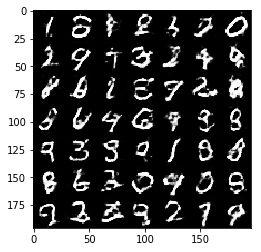

Epoch2/2 Steps2110 Discrimainator Loss: 0.6554 Generator Loss: 0.9346
Epoch2/2 Steps2120 Discrimainator Loss: 0.7812 Generator Loss: 0.8747
Epoch2/2 Steps2130 Discrimainator Loss: 0.8144 Generator Loss: 0.8706
Epoch2/2 Steps2140 Discrimainator Loss: 0.7714 Generator Loss: 0.8371
Epoch2/2 Steps2150 Discrimainator Loss: 0.7706 Generator Loss: 0.7687
Epoch2/2 Steps2160 Discrimainator Loss: 0.5762 Generator Loss: 1.1418
Epoch2/2 Steps2170 Discrimainator Loss: 0.5329 Generator Loss: 1.2214
Epoch2/2 Steps2180 Discrimainator Loss: 0.4899 Generator Loss: 1.5636
Epoch2/2 Steps2190 Discrimainator Loss: 0.7708 Generator Loss: 0.7602
Epoch2/2 Steps2200 Discrimainator Loss: 1.3731 Generator Loss: 0.3631


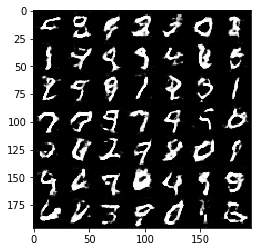

Epoch2/2 Steps2210 Discrimainator Loss: 1.0285 Generator Loss: 0.6410
Epoch2/2 Steps2220 Discrimainator Loss: 0.6073 Generator Loss: 1.0761
Epoch2/2 Steps2230 Discrimainator Loss: 0.4956 Generator Loss: 1.2963
Epoch2/2 Steps2240 Discrimainator Loss: 0.6693 Generator Loss: 1.0132
Epoch2/2 Steps2250 Discrimainator Loss: 0.5640 Generator Loss: 1.1621
Epoch2/2 Steps2260 Discrimainator Loss: 0.6314 Generator Loss: 1.0669
Epoch2/2 Steps2270 Discrimainator Loss: 0.6530 Generator Loss: 0.9870
Epoch2/2 Steps2280 Discrimainator Loss: 0.6318 Generator Loss: 0.9552
Epoch2/2 Steps2290 Discrimainator Loss: 0.8847 Generator Loss: 0.6900
Epoch2/2 Steps2300 Discrimainator Loss: 0.4433 Generator Loss: 1.3001


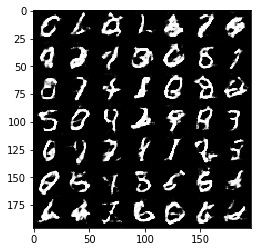

Epoch2/2 Steps2310 Discrimainator Loss: 0.9523 Generator Loss: 0.5990
Epoch2/2 Steps2320 Discrimainator Loss: 0.7762 Generator Loss: 0.8292
Epoch2/2 Steps2330 Discrimainator Loss: 0.4286 Generator Loss: 1.7722
Epoch2/2 Steps2340 Discrimainator Loss: 2.0291 Generator Loss: 0.2211
Epoch2/2 Steps2350 Discrimainator Loss: 1.2114 Generator Loss: 0.5518
Epoch2/2 Steps2360 Discrimainator Loss: 0.8831 Generator Loss: 0.6441
Epoch2/2 Steps2370 Discrimainator Loss: 0.9485 Generator Loss: 0.6502
Epoch2/2 Steps2380 Discrimainator Loss: 0.7538 Generator Loss: 0.7717
Epoch2/2 Steps2390 Discrimainator Loss: 0.3507 Generator Loss: 1.6538
Epoch2/2 Steps2400 Discrimainator Loss: 0.8334 Generator Loss: 0.7827


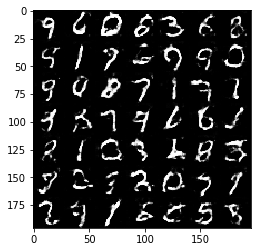

Epoch2/2 Steps2410 Discrimainator Loss: 0.6974 Generator Loss: 0.9013
Epoch2/2 Steps2420 Discrimainator Loss: 1.0457 Generator Loss: 0.5970
Epoch2/2 Steps2430 Discrimainator Loss: 0.6184 Generator Loss: 1.0997
Epoch2/2 Steps2440 Discrimainator Loss: 0.6519 Generator Loss: 1.0476
Epoch2/2 Steps2450 Discrimainator Loss: 0.6368 Generator Loss: 0.9627
Epoch2/2 Steps2460 Discrimainator Loss: 0.6201 Generator Loss: 0.9787
Epoch2/2 Steps2470 Discrimainator Loss: 0.4851 Generator Loss: 1.2460
Epoch2/2 Steps2480 Discrimainator Loss: 0.7751 Generator Loss: 0.7782
Epoch2/2 Steps2490 Discrimainator Loss: 0.9121 Generator Loss: 0.6973
Epoch2/2 Steps2500 Discrimainator Loss: 0.4338 Generator Loss: 1.8288


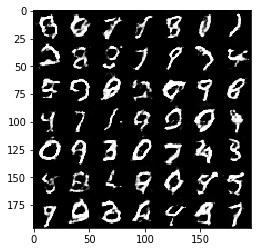

Epoch2/2 Steps2510 Discrimainator Loss: 0.5504 Generator Loss: 1.0386
Epoch2/2 Steps2520 Discrimainator Loss: 0.7198 Generator Loss: 0.8710
Epoch2/2 Steps2530 Discrimainator Loss: 0.5892 Generator Loss: 1.1474
Epoch2/2 Steps2540 Discrimainator Loss: 0.5103 Generator Loss: 1.1530
Epoch2/2 Steps2550 Discrimainator Loss: 4.2657 Generator Loss: 0.0319
Epoch2/2 Steps2560 Discrimainator Loss: 0.8029 Generator Loss: 0.8254
Epoch2/2 Steps2570 Discrimainator Loss: 0.6000 Generator Loss: 1.0855
Epoch2/2 Steps2580 Discrimainator Loss: 0.4073 Generator Loss: 1.6595
Epoch2/2 Steps2590 Discrimainator Loss: 0.6025 Generator Loss: 1.1377
Epoch2/2 Steps2600 Discrimainator Loss: 0.5946 Generator Loss: 1.0050


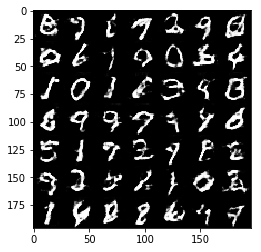

Epoch2/2 Steps2610 Discrimainator Loss: 0.5132 Generator Loss: 1.1255
Epoch2/2 Steps2620 Discrimainator Loss: 0.5123 Generator Loss: 2.8201
Epoch2/2 Steps2630 Discrimainator Loss: 0.5202 Generator Loss: 1.1651
Epoch2/2 Steps2640 Discrimainator Loss: 0.8967 Generator Loss: 0.6822
Epoch2/2 Steps2650 Discrimainator Loss: 0.5706 Generator Loss: 1.0400
Epoch2/2 Steps2660 Discrimainator Loss: 0.5445 Generator Loss: 1.1585
Epoch2/2 Steps2670 Discrimainator Loss: 0.7165 Generator Loss: 0.8210
Epoch2/2 Steps2680 Discrimainator Loss: 0.6877 Generator Loss: 0.9140
Epoch2/2 Steps2690 Discrimainator Loss: 1.0795 Generator Loss: 0.5454
Epoch2/2 Steps2700 Discrimainator Loss: 0.5067 Generator Loss: 1.1334


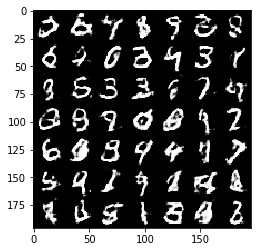

Epoch2/2 Steps2710 Discrimainator Loss: 0.7509 Generator Loss: 0.8716
Epoch2/2 Steps2720 Discrimainator Loss: 0.7226 Generator Loss: 3.4622
Epoch2/2 Steps2730 Discrimainator Loss: 1.9056 Generator Loss: 4.9920
Epoch2/2 Steps2740 Discrimainator Loss: 0.5948 Generator Loss: 1.0918
Epoch2/2 Steps2750 Discrimainator Loss: 0.6902 Generator Loss: 0.9584
Epoch2/2 Steps2760 Discrimainator Loss: 0.5772 Generator Loss: 1.1879
Epoch2/2 Steps2770 Discrimainator Loss: 0.4294 Generator Loss: 1.7942
Epoch2/2 Steps2780 Discrimainator Loss: 1.4354 Generator Loss: 0.3546
Epoch2/2 Steps2790 Discrimainator Loss: 0.8426 Generator Loss: 0.7088
Epoch2/2 Steps2800 Discrimainator Loss: 0.3465 Generator Loss: 1.6782


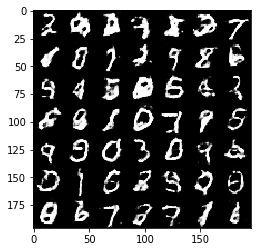

Epoch2/2 Steps2810 Discrimainator Loss: 0.6862 Generator Loss: 0.8765
Epoch2/2 Steps2820 Discrimainator Loss: 0.5919 Generator Loss: 1.1483
Epoch2/2 Steps2830 Discrimainator Loss: 0.9630 Generator Loss: 0.5913
Epoch2/2 Steps2840 Discrimainator Loss: 0.5998 Generator Loss: 1.0097
Epoch2/2 Steps2850 Discrimainator Loss: 1.3565 Generator Loss: 2.7765
Epoch2/2 Steps2860 Discrimainator Loss: 0.4425 Generator Loss: 1.7400
Epoch2/2 Steps2870 Discrimainator Loss: 0.8079 Generator Loss: 0.8417
Epoch2/2 Steps2880 Discrimainator Loss: 0.4346 Generator Loss: 1.7322
Epoch2/2 Steps2890 Discrimainator Loss: 1.1367 Generator Loss: 0.5313
Epoch2/2 Steps2900 Discrimainator Loss: 0.9629 Generator Loss: 0.6095


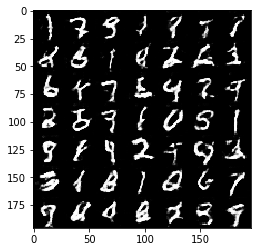

Epoch2/2 Steps2910 Discrimainator Loss: 0.5510 Generator Loss: 1.1477
Epoch2/2 Steps2920 Discrimainator Loss: 0.5139 Generator Loss: 1.0577
Epoch2/2 Steps2930 Discrimainator Loss: 0.7258 Generator Loss: 0.8362
Epoch2/2 Steps2940 Discrimainator Loss: 0.5913 Generator Loss: 1.0745
Epoch2/2 Steps2950 Discrimainator Loss: 0.6632 Generator Loss: 0.9315
Epoch2/2 Steps2960 Discrimainator Loss: 0.4806 Generator Loss: 1.8447
Epoch2/2 Steps2970 Discrimainator Loss: 0.3961 Generator Loss: 1.5352
Epoch2/2 Steps2980 Discrimainator Loss: 0.3088 Generator Loss: 1.5942
Epoch2/2 Steps2990 Discrimainator Loss: 1.1604 Generator Loss: 2.6477
Epoch2/2 Steps3000 Discrimainator Loss: 0.7189 Generator Loss: 1.1301


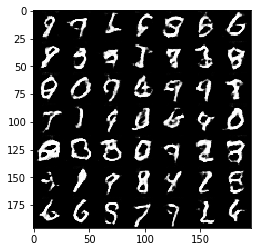

Epoch2/2 Steps3010 Discrimainator Loss: 0.5748 Generator Loss: 1.2105
Epoch2/2 Steps3020 Discrimainator Loss: 0.8517 Generator Loss: 0.7279
Epoch2/2 Steps3030 Discrimainator Loss: 0.5367 Generator Loss: 1.2230
Epoch2/2 Steps3040 Discrimainator Loss: 0.5955 Generator Loss: 1.2138
Epoch2/2 Steps3050 Discrimainator Loss: 0.4827 Generator Loss: 1.3070
Epoch2/2 Steps3060 Discrimainator Loss: 0.7478 Generator Loss: 0.8517
Epoch2/2 Steps3070 Discrimainator Loss: 0.8158 Generator Loss: 0.7713
Epoch2/2 Steps3080 Discrimainator Loss: 0.5657 Generator Loss: 1.0676
Epoch2/2 Steps3090 Discrimainator Loss: 0.9713 Generator Loss: 0.6171
Epoch2/2 Steps3100 Discrimainator Loss: 0.5888 Generator Loss: 1.2958


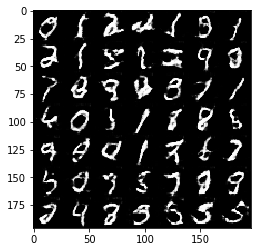

Epoch2/2 Steps3110 Discrimainator Loss: 0.5675 Generator Loss: 1.1003
Epoch2/2 Steps3120 Discrimainator Loss: 0.4890 Generator Loss: 1.2352
Epoch2/2 Steps3130 Discrimainator Loss: 0.3984 Generator Loss: 1.4172
Epoch2/2 Steps3140 Discrimainator Loss: 0.6450 Generator Loss: 3.0567
Epoch2/2 Steps3150 Discrimainator Loss: 1.1073 Generator Loss: 4.1713
Epoch2/2 Steps3160 Discrimainator Loss: 0.5879 Generator Loss: 1.2226
Epoch2/2 Steps3170 Discrimainator Loss: 0.6304 Generator Loss: 1.0974
Epoch2/2 Steps3180 Discrimainator Loss: 0.6194 Generator Loss: 0.9853
Epoch2/2 Steps3190 Discrimainator Loss: 0.9892 Generator Loss: 0.6058
Epoch2/2 Steps3200 Discrimainator Loss: 0.7199 Generator Loss: 0.9075


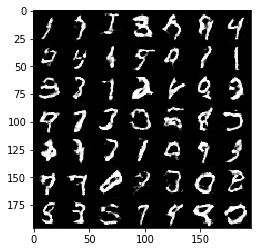

Epoch2/2 Steps3210 Discrimainator Loss: 0.5765 Generator Loss: 1.2035
Epoch2/2 Steps3220 Discrimainator Loss: 0.6301 Generator Loss: 0.9996
Epoch2/2 Steps3230 Discrimainator Loss: 0.6172 Generator Loss: 1.0321
Epoch2/2 Steps3240 Discrimainator Loss: 0.5573 Generator Loss: 1.1228
Epoch2/2 Steps3250 Discrimainator Loss: 0.7179 Generator Loss: 2.2071
Epoch2/2 Steps3260 Discrimainator Loss: 0.6792 Generator Loss: 0.9436
Epoch2/2 Steps3270 Discrimainator Loss: 0.5433 Generator Loss: 1.2688
Epoch2/2 Steps3280 Discrimainator Loss: 0.4863 Generator Loss: 1.2334
Epoch2/2 Steps3290 Discrimainator Loss: 0.7467 Generator Loss: 0.8259
Epoch2/2 Steps3300 Discrimainator Loss: 0.5769 Generator Loss: 1.1511


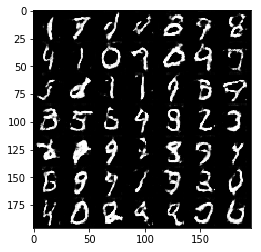

Epoch2/2 Steps3310 Discrimainator Loss: 0.7809 Generator Loss: 0.8191
Epoch2/2 Steps3320 Discrimainator Loss: 0.5571 Generator Loss: 1.2185
Epoch2/2 Steps3330 Discrimainator Loss: 0.5868 Generator Loss: 1.0717
Epoch2/2 Steps3340 Discrimainator Loss: 0.4359 Generator Loss: 1.3206
Epoch2/2 Steps3350 Discrimainator Loss: 0.7978 Generator Loss: 0.7543
Epoch2/2 Steps3360 Discrimainator Loss: 1.3099 Generator Loss: 0.4680
Epoch2/2 Steps3370 Discrimainator Loss: 0.4011 Generator Loss: 1.7569
Epoch2/2 Steps3380 Discrimainator Loss: 0.7330 Generator Loss: 0.8540
Epoch2/2 Steps3390 Discrimainator Loss: 1.0054 Generator Loss: 0.6358
Epoch2/2 Steps3400 Discrimainator Loss: 0.7913 Generator Loss: 0.8699


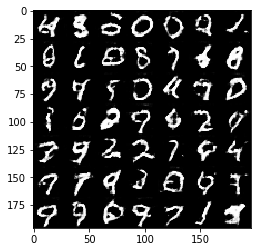

Epoch2/2 Steps3410 Discrimainator Loss: 0.6086 Generator Loss: 0.9812
Epoch2/2 Steps3420 Discrimainator Loss: 3.8662 Generator Loss: 7.0864
Epoch2/2 Steps3430 Discrimainator Loss: 0.4462 Generator Loss: 1.4628
Epoch2/2 Steps3440 Discrimainator Loss: 0.5621 Generator Loss: 1.1320
Epoch2/2 Steps3450 Discrimainator Loss: 1.2697 Generator Loss: 0.4431
Epoch2/2 Steps3460 Discrimainator Loss: 0.8368 Generator Loss: 0.7328
Epoch2/2 Steps3470 Discrimainator Loss: 0.5981 Generator Loss: 1.0459
Epoch2/2 Steps3480 Discrimainator Loss: 0.9912 Generator Loss: 3.2055
Epoch2/2 Steps3490 Discrimainator Loss: 0.8278 Generator Loss: 0.7273
Epoch2/2 Steps3500 Discrimainator Loss: 0.6329 Generator Loss: 0.9704


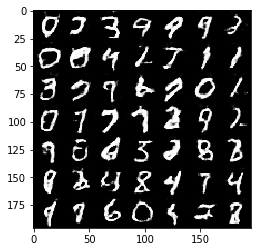

Epoch2/2 Steps3510 Discrimainator Loss: 1.1223 Generator Loss: 0.5058
Epoch2/2 Steps3520 Discrimainator Loss: 1.1589 Generator Loss: 0.5199
Epoch2/2 Steps3530 Discrimainator Loss: 0.6249 Generator Loss: 1.0182
Epoch2/2 Steps3540 Discrimainator Loss: 0.6297 Generator Loss: 1.0393
Epoch2/2 Steps3550 Discrimainator Loss: 0.8628 Generator Loss: 0.7108
Epoch2/2 Steps3560 Discrimainator Loss: 0.9511 Generator Loss: 0.6275
Epoch2/2 Steps3570 Discrimainator Loss: 3.1540 Generator Loss: 4.4252
Epoch2/2 Steps3580 Discrimainator Loss: 1.3404 Generator Loss: 4.0431
Epoch2/2 Steps3590 Discrimainator Loss: 1.1573 Generator Loss: 0.5098
Epoch2/2 Steps3600 Discrimainator Loss: 0.5637 Generator Loss: 1.1105


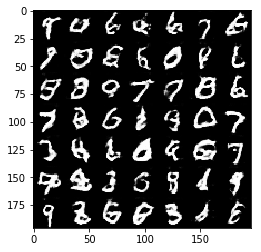

Epoch2/2 Steps3610 Discrimainator Loss: 0.5547 Generator Loss: 1.1790
Epoch2/2 Steps3620 Discrimainator Loss: 0.5990 Generator Loss: 1.2879
Epoch2/2 Steps3630 Discrimainator Loss: 1.1304 Generator Loss: 0.5245
Epoch2/2 Steps3640 Discrimainator Loss: 0.5880 Generator Loss: 1.2306
Epoch2/2 Steps3650 Discrimainator Loss: 0.5564 Generator Loss: 1.1355
Epoch2/2 Steps3660 Discrimainator Loss: 0.6060 Generator Loss: 1.0248
Epoch2/2 Steps3670 Discrimainator Loss: 0.6480 Generator Loss: 0.8762
Epoch2/2 Steps3680 Discrimainator Loss: 0.8971 Generator Loss: 0.6398
Epoch2/2 Steps3690 Discrimainator Loss: 0.5131 Generator Loss: 1.2868
Epoch2/2 Steps3700 Discrimainator Loss: 0.7945 Generator Loss: 0.8253


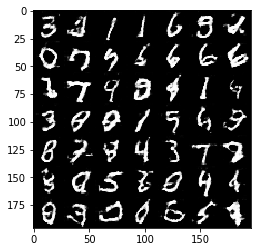

Epoch2/2 Steps3710 Discrimainator Loss: 0.5881 Generator Loss: 1.1397
Epoch2/2 Steps3720 Discrimainator Loss: 0.8640 Generator Loss: 0.7467
Epoch2/2 Steps3730 Discrimainator Loss: 1.2489 Generator Loss: 0.4804
Epoch2/2 Steps3740 Discrimainator Loss: 0.5746 Generator Loss: 1.0352
Epoch2/2 Steps3750 Discrimainator Loss: 0.4746 Generator Loss: 1.3176


In [15]:
batch_size = 32
z_dim = 128
learning_rate = 0.0001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch1/1 Steps10 Discrimainator Loss: 0.7515 Generator Loss: 0.7637
Epoch1/1 Steps20 Discrimainator Loss: 0.4724 Generator Loss: 1.2677
Epoch1/1 Steps30 Discrimainator Loss: 0.7093 Generator Loss: 0.7964
Epoch1/1 Steps40 Discrimainator Loss: 0.1887 Generator Loss: 2.4490
Epoch1/1 Steps50 Discrimainator Loss: 0.8399 Generator Loss: 0.6244
Epoch1/1 Steps60 Discrimainator Loss: 0.3040 Generator Loss: 1.6506
Epoch1/1 Steps70 Discrimainator Loss: 0.5290 Generator Loss: 1.0669
Epoch1/1 Steps80 Discrimainator Loss: 1.8820 Generator Loss: 0.1925
Epoch1/1 Steps90 Discrimainator Loss: 0.3122 Generator Loss: 1.5707
Epoch1/1 Steps100 Discrimainator Loss: 0.1129 Generator Loss: 2.8050


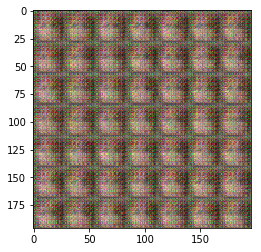

Epoch1/1 Steps110 Discrimainator Loss: 0.1753 Generator Loss: 2.3000
Epoch1/1 Steps120 Discrimainator Loss: 0.0708 Generator Loss: 7.4634
Epoch1/1 Steps130 Discrimainator Loss: 0.6827 Generator Loss: 5.3857
Epoch1/1 Steps140 Discrimainator Loss: 0.0859 Generator Loss: 3.4304
Epoch1/1 Steps150 Discrimainator Loss: 0.2362 Generator Loss: 1.8970
Epoch1/1 Steps160 Discrimainator Loss: 0.2935 Generator Loss: 1.6882
Epoch1/1 Steps170 Discrimainator Loss: 1.0616 Generator Loss: 0.4880
Epoch1/1 Steps180 Discrimainator Loss: 0.7419 Generator Loss: 0.7271
Epoch1/1 Steps190 Discrimainator Loss: 0.1285 Generator Loss: 2.6823
Epoch1/1 Steps200 Discrimainator Loss: 0.0995 Generator Loss: 4.9727


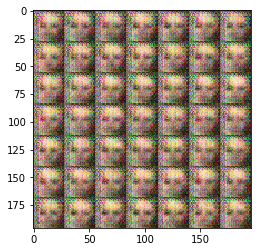

Epoch1/1 Steps210 Discrimainator Loss: 0.1627 Generator Loss: 2.5958
Epoch1/1 Steps220 Discrimainator Loss: 1.3768 Generator Loss: 0.3435
Epoch1/1 Steps230 Discrimainator Loss: 0.0612 Generator Loss: 6.0666
Epoch1/1 Steps240 Discrimainator Loss: 0.2301 Generator Loss: 2.1523
Epoch1/1 Steps250 Discrimainator Loss: 0.1308 Generator Loss: 2.6637
Epoch1/1 Steps260 Discrimainator Loss: 0.1293 Generator Loss: 2.7159
Epoch1/1 Steps270 Discrimainator Loss: 0.1227 Generator Loss: 3.4367
Epoch1/1 Steps280 Discrimainator Loss: 0.6982 Generator Loss: 9.4932
Epoch1/1 Steps290 Discrimainator Loss: 0.1040 Generator Loss: 6.0529
Epoch1/1 Steps300 Discrimainator Loss: 0.0218 Generator Loss: 4.6578


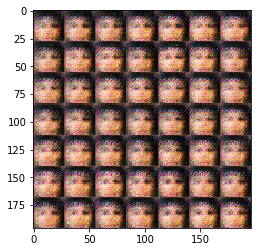

Epoch1/1 Steps310 Discrimainator Loss: 0.1574 Generator Loss: 2.4203
Epoch1/1 Steps320 Discrimainator Loss: 0.0713 Generator Loss: 3.3546
Epoch1/1 Steps330 Discrimainator Loss: 0.1614 Generator Loss: 2.4599
Epoch1/1 Steps340 Discrimainator Loss: 0.1160 Generator Loss: 2.7600
Epoch1/1 Steps350 Discrimainator Loss: 0.6922 Generator Loss: 0.9759
Epoch1/1 Steps360 Discrimainator Loss: 0.5587 Generator Loss: 1.2444
Epoch1/1 Steps370 Discrimainator Loss: 1.3640 Generator Loss: 0.4218
Epoch1/1 Steps380 Discrimainator Loss: 0.2961 Generator Loss: 1.9050
Epoch1/1 Steps390 Discrimainator Loss: 0.3616 Generator Loss: 1.4861
Epoch1/1 Steps400 Discrimainator Loss: 0.5139 Generator Loss: 3.3655


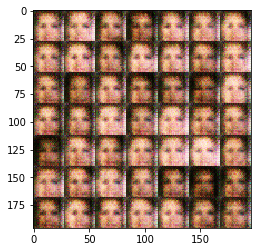

Epoch1/1 Steps410 Discrimainator Loss: 0.6264 Generator Loss: 0.9918
Epoch1/1 Steps420 Discrimainator Loss: 1.0704 Generator Loss: 9.1645
Epoch1/1 Steps430 Discrimainator Loss: 1.9818 Generator Loss: 0.1967
Epoch1/1 Steps440 Discrimainator Loss: 0.4355 Generator Loss: 1.7700
Epoch1/1 Steps450 Discrimainator Loss: 0.2473 Generator Loss: 2.9790
Epoch1/1 Steps460 Discrimainator Loss: 0.4784 Generator Loss: 1.3408
Epoch1/1 Steps470 Discrimainator Loss: 0.3713 Generator Loss: 1.6506
Epoch1/1 Steps480 Discrimainator Loss: 0.7977 Generator Loss: 0.8725
Epoch1/1 Steps490 Discrimainator Loss: 1.3518 Generator Loss: 0.4464
Epoch1/1 Steps500 Discrimainator Loss: 1.1404 Generator Loss: 0.5834


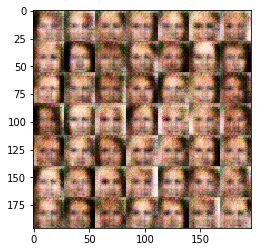

Epoch1/1 Steps510 Discrimainator Loss: 0.5291 Generator Loss: 1.5737
Epoch1/1 Steps520 Discrimainator Loss: 1.0161 Generator Loss: 4.0799
Epoch1/1 Steps530 Discrimainator Loss: 0.7198 Generator Loss: 1.9003
Epoch1/1 Steps540 Discrimainator Loss: 0.4169 Generator Loss: 1.6938
Epoch1/1 Steps550 Discrimainator Loss: 0.6848 Generator Loss: 3.2817
Epoch1/1 Steps560 Discrimainator Loss: 0.7337 Generator Loss: 0.9987
Epoch1/1 Steps570 Discrimainator Loss: 0.6316 Generator Loss: 1.0666
Epoch1/1 Steps580 Discrimainator Loss: 0.8391 Generator Loss: 0.6942
Epoch1/1 Steps590 Discrimainator Loss: 1.8422 Generator Loss: 4.4764
Epoch1/1 Steps600 Discrimainator Loss: 0.7684 Generator Loss: 2.2829


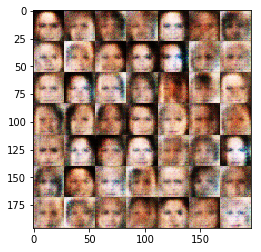

Epoch1/1 Steps610 Discrimainator Loss: 0.8898 Generator Loss: 0.7541
Epoch1/1 Steps620 Discrimainator Loss: 0.7263 Generator Loss: 2.8952
Epoch1/1 Steps630 Discrimainator Loss: 1.1679 Generator Loss: 3.8648
Epoch1/1 Steps640 Discrimainator Loss: 0.7276 Generator Loss: 0.9671
Epoch1/1 Steps650 Discrimainator Loss: 0.7325 Generator Loss: 0.9555
Epoch1/1 Steps660 Discrimainator Loss: 0.7854 Generator Loss: 2.8395
Epoch1/1 Steps670 Discrimainator Loss: 0.8218 Generator Loss: 0.7521
Epoch1/1 Steps680 Discrimainator Loss: 1.5196 Generator Loss: 0.3659
Epoch1/1 Steps690 Discrimainator Loss: 0.6141 Generator Loss: 2.3846
Epoch1/1 Steps700 Discrimainator Loss: 0.4764 Generator Loss: 1.4355


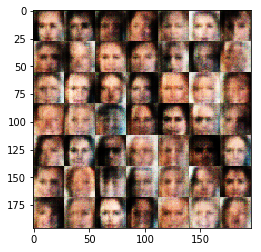

Epoch1/1 Steps710 Discrimainator Loss: 0.6024 Generator Loss: 3.5226
Epoch1/1 Steps720 Discrimainator Loss: 0.4560 Generator Loss: 1.9324
Epoch1/1 Steps730 Discrimainator Loss: 1.4182 Generator Loss: 3.2690
Epoch1/1 Steps740 Discrimainator Loss: 0.5656 Generator Loss: 2.7765
Epoch1/1 Steps750 Discrimainator Loss: 0.8789 Generator Loss: 0.6816
Epoch1/1 Steps760 Discrimainator Loss: 0.5773 Generator Loss: 1.5880
Epoch1/1 Steps770 Discrimainator Loss: 0.6433 Generator Loss: 2.0518
Epoch1/1 Steps780 Discrimainator Loss: 0.6854 Generator Loss: 1.0199
Epoch1/1 Steps790 Discrimainator Loss: 0.7211 Generator Loss: 2.3763
Epoch1/1 Steps800 Discrimainator Loss: 0.5281 Generator Loss: 1.4027


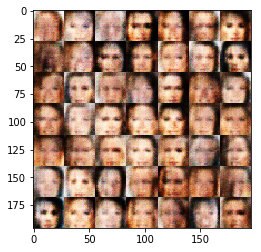

Epoch1/1 Steps810 Discrimainator Loss: 1.0632 Generator Loss: 2.0864
Epoch1/1 Steps820 Discrimainator Loss: 0.8539 Generator Loss: 2.6596
Epoch1/1 Steps830 Discrimainator Loss: 1.6942 Generator Loss: 0.2401
Epoch1/1 Steps840 Discrimainator Loss: 0.8966 Generator Loss: 0.6567
Epoch1/1 Steps850 Discrimainator Loss: 1.6442 Generator Loss: 0.3016
Epoch1/1 Steps860 Discrimainator Loss: 0.5615 Generator Loss: 1.6911
Epoch1/1 Steps870 Discrimainator Loss: 0.8155 Generator Loss: 1.9768
Epoch1/1 Steps880 Discrimainator Loss: 0.9702 Generator Loss: 0.6538
Epoch1/1 Steps890 Discrimainator Loss: 1.3973 Generator Loss: 0.3325
Epoch1/1 Steps900 Discrimainator Loss: 0.6786 Generator Loss: 1.0844


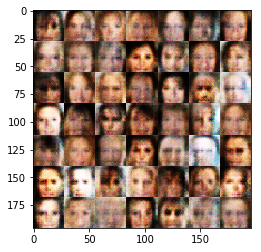

Epoch1/1 Steps910 Discrimainator Loss: 0.7284 Generator Loss: 1.3659
Epoch1/1 Steps920 Discrimainator Loss: 0.8529 Generator Loss: 2.5571
Epoch1/1 Steps930 Discrimainator Loss: 1.7550 Generator Loss: 0.2227
Epoch1/1 Steps940 Discrimainator Loss: 1.1053 Generator Loss: 0.5129
Epoch1/1 Steps950 Discrimainator Loss: 0.7488 Generator Loss: 1.0831
Epoch1/1 Steps960 Discrimainator Loss: 1.5433 Generator Loss: 0.2783
Epoch1/1 Steps970 Discrimainator Loss: 1.1179 Generator Loss: 0.4971
Epoch1/1 Steps980 Discrimainator Loss: 1.1990 Generator Loss: 0.4941
Epoch1/1 Steps990 Discrimainator Loss: 0.6865 Generator Loss: 0.9903
Epoch1/1 Steps1000 Discrimainator Loss: 0.8934 Generator Loss: 2.1498


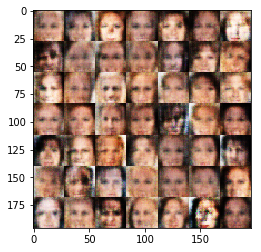

Epoch1/1 Steps1010 Discrimainator Loss: 0.7966 Generator Loss: 1.1623
Epoch1/1 Steps1020 Discrimainator Loss: 0.6531 Generator Loss: 1.0900
Epoch1/1 Steps1030 Discrimainator Loss: 0.8408 Generator Loss: 1.7670
Epoch1/1 Steps1040 Discrimainator Loss: 1.7164 Generator Loss: 0.2446
Epoch1/1 Steps1050 Discrimainator Loss: 0.7628 Generator Loss: 1.0850
Epoch1/1 Steps1060 Discrimainator Loss: 1.7149 Generator Loss: 0.2348
Epoch1/1 Steps1070 Discrimainator Loss: 1.0000 Generator Loss: 0.5844
Epoch1/1 Steps1080 Discrimainator Loss: 1.1982 Generator Loss: 0.4365
Epoch1/1 Steps1090 Discrimainator Loss: 0.8631 Generator Loss: 0.9667
Epoch1/1 Steps1100 Discrimainator Loss: 0.9667 Generator Loss: 2.3073


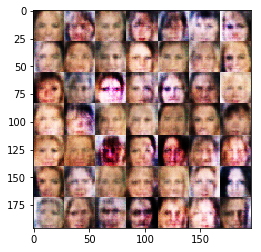

Epoch1/1 Steps1110 Discrimainator Loss: 0.8756 Generator Loss: 0.7506
Epoch1/1 Steps1120 Discrimainator Loss: 0.9010 Generator Loss: 2.7067
Epoch1/1 Steps1130 Discrimainator Loss: 0.7985 Generator Loss: 0.9943
Epoch1/1 Steps1140 Discrimainator Loss: 0.8901 Generator Loss: 0.8349
Epoch1/1 Steps1150 Discrimainator Loss: 0.9361 Generator Loss: 0.6243
Epoch1/1 Steps1160 Discrimainator Loss: 0.6759 Generator Loss: 0.9756
Epoch1/1 Steps1170 Discrimainator Loss: 0.8681 Generator Loss: 0.6932
Epoch1/1 Steps1180 Discrimainator Loss: 0.9323 Generator Loss: 2.2158
Epoch1/1 Steps1190 Discrimainator Loss: 1.2168 Generator Loss: 0.4327
Epoch1/1 Steps1200 Discrimainator Loss: 1.1568 Generator Loss: 0.4636


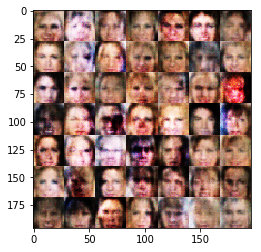

Epoch1/1 Steps1210 Discrimainator Loss: 0.9049 Generator Loss: 0.6791
Epoch1/1 Steps1220 Discrimainator Loss: 0.8823 Generator Loss: 0.7744
Epoch1/1 Steps1230 Discrimainator Loss: 0.9928 Generator Loss: 0.5742
Epoch1/1 Steps1240 Discrimainator Loss: 0.9117 Generator Loss: 0.6610
Epoch1/1 Steps1250 Discrimainator Loss: 1.2550 Generator Loss: 0.4084
Epoch1/1 Steps1260 Discrimainator Loss: 0.9266 Generator Loss: 0.7026
Epoch1/1 Steps1270 Discrimainator Loss: 1.0272 Generator Loss: 1.9628
Epoch1/1 Steps1280 Discrimainator Loss: 1.4003 Generator Loss: 2.2920
Epoch1/1 Steps1290 Discrimainator Loss: 1.1048 Generator Loss: 0.5548
Epoch1/1 Steps1300 Discrimainator Loss: 1.3191 Generator Loss: 0.3805


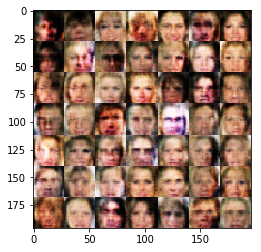

Epoch1/1 Steps1310 Discrimainator Loss: 1.0510 Generator Loss: 0.5817
Epoch1/1 Steps1320 Discrimainator Loss: 1.2425 Generator Loss: 0.4376
Epoch1/1 Steps1330 Discrimainator Loss: 1.1175 Generator Loss: 0.4933
Epoch1/1 Steps1340 Discrimainator Loss: 0.8205 Generator Loss: 1.0855
Epoch1/1 Steps1350 Discrimainator Loss: 0.8318 Generator Loss: 2.2845
Epoch1/1 Steps1360 Discrimainator Loss: 0.8651 Generator Loss: 1.2480
Epoch1/1 Steps1370 Discrimainator Loss: 1.0442 Generator Loss: 0.6547
Epoch1/1 Steps1380 Discrimainator Loss: 0.8263 Generator Loss: 0.8150
Epoch1/1 Steps1390 Discrimainator Loss: 0.6425 Generator Loss: 1.7425
Epoch1/1 Steps1400 Discrimainator Loss: 1.2365 Generator Loss: 2.5488


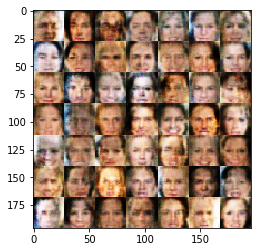

Epoch1/1 Steps1410 Discrimainator Loss: 0.9710 Generator Loss: 1.1171
Epoch1/1 Steps1420 Discrimainator Loss: 1.0719 Generator Loss: 1.0953
Epoch1/1 Steps1430 Discrimainator Loss: 0.8841 Generator Loss: 0.8952
Epoch1/1 Steps1440 Discrimainator Loss: 0.8570 Generator Loss: 0.8231
Epoch1/1 Steps1450 Discrimainator Loss: 0.8374 Generator Loss: 1.7312
Epoch1/1 Steps1460 Discrimainator Loss: 0.8273 Generator Loss: 1.0198
Epoch1/1 Steps1470 Discrimainator Loss: 0.9464 Generator Loss: 2.3283
Epoch1/1 Steps1480 Discrimainator Loss: 0.8574 Generator Loss: 1.5598
Epoch1/1 Steps1490 Discrimainator Loss: 0.7782 Generator Loss: 1.1310
Epoch1/1 Steps1500 Discrimainator Loss: 0.9129 Generator Loss: 2.0344


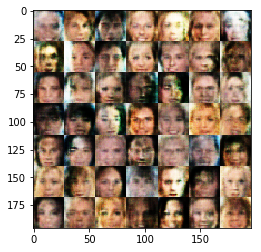

Epoch1/1 Steps1510 Discrimainator Loss: 0.9056 Generator Loss: 1.1365
Epoch1/1 Steps1520 Discrimainator Loss: 0.7137 Generator Loss: 1.0721
Epoch1/1 Steps1530 Discrimainator Loss: 0.9631 Generator Loss: 0.7437
Epoch1/1 Steps1540 Discrimainator Loss: 0.6920 Generator Loss: 1.9656
Epoch1/1 Steps1550 Discrimainator Loss: 0.8406 Generator Loss: 1.1036
Epoch1/1 Steps1560 Discrimainator Loss: 0.6577 Generator Loss: 1.7164
Epoch1/1 Steps1570 Discrimainator Loss: 0.9907 Generator Loss: 1.4243
Epoch1/1 Steps1580 Discrimainator Loss: 1.3025 Generator Loss: 0.4154
Epoch1/1 Steps1590 Discrimainator Loss: 1.3608 Generator Loss: 0.3702
Epoch1/1 Steps1600 Discrimainator Loss: 1.0696 Generator Loss: 0.5458


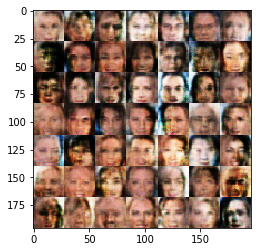

Epoch1/1 Steps1610 Discrimainator Loss: 1.2861 Generator Loss: 0.4100
Epoch1/1 Steps1620 Discrimainator Loss: 0.8603 Generator Loss: 1.3332
Epoch1/1 Steps1630 Discrimainator Loss: 0.6500 Generator Loss: 1.2506
Epoch1/1 Steps1640 Discrimainator Loss: 0.7715 Generator Loss: 1.3017
Epoch1/1 Steps1650 Discrimainator Loss: 0.7588 Generator Loss: 1.2153
Epoch1/1 Steps1660 Discrimainator Loss: 1.2980 Generator Loss: 0.3897
Epoch1/1 Steps1670 Discrimainator Loss: 0.8660 Generator Loss: 0.7856
Epoch1/1 Steps1680 Discrimainator Loss: 0.8801 Generator Loss: 1.6424
Epoch1/1 Steps1690 Discrimainator Loss: 0.7355 Generator Loss: 1.6504
Epoch1/1 Steps1700 Discrimainator Loss: 0.7969 Generator Loss: 1.2462


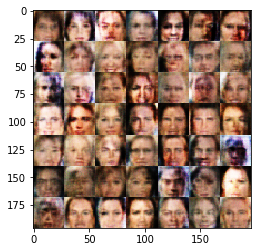

Epoch1/1 Steps1710 Discrimainator Loss: 0.7318 Generator Loss: 1.4167
Epoch1/1 Steps1720 Discrimainator Loss: 0.9880 Generator Loss: 0.6876
Epoch1/1 Steps1730 Discrimainator Loss: 1.1225 Generator Loss: 0.5330
Epoch1/1 Steps1740 Discrimainator Loss: 0.6667 Generator Loss: 1.9708
Epoch1/1 Steps1750 Discrimainator Loss: 0.9887 Generator Loss: 1.0284
Epoch1/1 Steps1760 Discrimainator Loss: 0.9902 Generator Loss: 1.2843
Epoch1/1 Steps1770 Discrimainator Loss: 1.0525 Generator Loss: 0.6237
Epoch1/1 Steps1780 Discrimainator Loss: 0.8703 Generator Loss: 0.6932
Epoch1/1 Steps1790 Discrimainator Loss: 0.7415 Generator Loss: 1.5740
Epoch1/1 Steps1800 Discrimainator Loss: 0.9334 Generator Loss: 1.2990


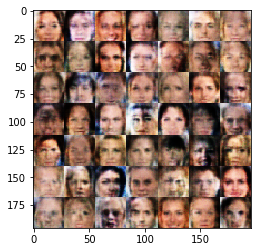

Epoch1/1 Steps1810 Discrimainator Loss: 0.8226 Generator Loss: 1.3838
Epoch1/1 Steps1820 Discrimainator Loss: 1.0884 Generator Loss: 0.5023
Epoch1/1 Steps1830 Discrimainator Loss: 1.1707 Generator Loss: 0.4760
Epoch1/1 Steps1840 Discrimainator Loss: 1.0366 Generator Loss: 0.6235
Epoch1/1 Steps1850 Discrimainator Loss: 1.2829 Generator Loss: 2.2185
Epoch1/1 Steps1860 Discrimainator Loss: 0.8853 Generator Loss: 0.6829
Epoch1/1 Steps1870 Discrimainator Loss: 1.0256 Generator Loss: 1.4713
Epoch1/1 Steps1880 Discrimainator Loss: 0.9224 Generator Loss: 0.8099
Epoch1/1 Steps1890 Discrimainator Loss: 1.2209 Generator Loss: 0.4552
Epoch1/1 Steps1900 Discrimainator Loss: 1.3099 Generator Loss: 2.3673


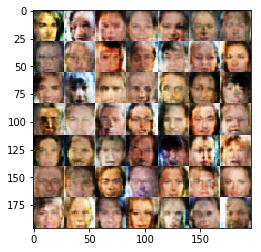

Epoch1/1 Steps1910 Discrimainator Loss: 0.9807 Generator Loss: 1.5722
Epoch1/1 Steps1920 Discrimainator Loss: 0.7137 Generator Loss: 1.4940
Epoch1/1 Steps1930 Discrimainator Loss: 0.9253 Generator Loss: 0.7087
Epoch1/1 Steps1940 Discrimainator Loss: 1.2800 Generator Loss: 0.3910
Epoch1/1 Steps1950 Discrimainator Loss: 0.7466 Generator Loss: 1.7578
Epoch1/1 Steps1960 Discrimainator Loss: 0.6223 Generator Loss: 1.7872
Epoch1/1 Steps1970 Discrimainator Loss: 0.9827 Generator Loss: 0.6605
Epoch1/1 Steps1980 Discrimainator Loss: 0.8080 Generator Loss: 1.1716
Epoch1/1 Steps1990 Discrimainator Loss: 0.9888 Generator Loss: 0.6954
Epoch1/1 Steps2000 Discrimainator Loss: 1.0022 Generator Loss: 0.5796


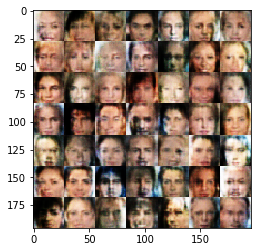

Epoch1/1 Steps2010 Discrimainator Loss: 1.1339 Generator Loss: 0.4637
Epoch1/1 Steps2020 Discrimainator Loss: 0.9242 Generator Loss: 0.7479
Epoch1/1 Steps2030 Discrimainator Loss: 0.8726 Generator Loss: 0.6953
Epoch1/1 Steps2040 Discrimainator Loss: 1.6253 Generator Loss: 0.2577
Epoch1/1 Steps2050 Discrimainator Loss: 1.2460 Generator Loss: 0.4222
Epoch1/1 Steps2060 Discrimainator Loss: 1.1098 Generator Loss: 1.1958
Epoch1/1 Steps2070 Discrimainator Loss: 1.0179 Generator Loss: 1.8972
Epoch1/1 Steps2080 Discrimainator Loss: 0.9515 Generator Loss: 0.8643
Epoch1/1 Steps2090 Discrimainator Loss: 1.3462 Generator Loss: 1.9860
Epoch1/1 Steps2100 Discrimainator Loss: 0.7544 Generator Loss: 1.3459


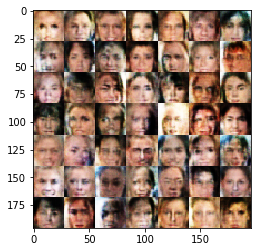

Epoch1/1 Steps2110 Discrimainator Loss: 1.3813 Generator Loss: 0.3338
Epoch1/1 Steps2120 Discrimainator Loss: 0.8343 Generator Loss: 1.5279
Epoch1/1 Steps2130 Discrimainator Loss: 0.7271 Generator Loss: 1.1530
Epoch1/1 Steps2140 Discrimainator Loss: 0.8000 Generator Loss: 1.5185
Epoch1/1 Steps2150 Discrimainator Loss: 0.9438 Generator Loss: 0.8700
Epoch1/1 Steps2160 Discrimainator Loss: 1.1423 Generator Loss: 0.5633
Epoch1/1 Steps2170 Discrimainator Loss: 1.1471 Generator Loss: 0.4705
Epoch1/1 Steps2180 Discrimainator Loss: 1.6147 Generator Loss: 0.2572
Epoch1/1 Steps2190 Discrimainator Loss: 0.8095 Generator Loss: 1.7652
Epoch1/1 Steps2200 Discrimainator Loss: 0.7447 Generator Loss: 1.0041


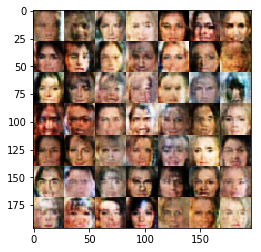

Epoch1/1 Steps2210 Discrimainator Loss: 0.9566 Generator Loss: 0.8423
Epoch1/1 Steps2220 Discrimainator Loss: 1.3820 Generator Loss: 2.3039
Epoch1/1 Steps2230 Discrimainator Loss: 0.9220 Generator Loss: 0.7039
Epoch1/1 Steps2240 Discrimainator Loss: 1.4038 Generator Loss: 0.3653
Epoch1/1 Steps2250 Discrimainator Loss: 0.7727 Generator Loss: 1.0497
Epoch1/1 Steps2260 Discrimainator Loss: 1.0868 Generator Loss: 0.5298
Epoch1/1 Steps2270 Discrimainator Loss: 1.2324 Generator Loss: 0.4472
Epoch1/1 Steps2280 Discrimainator Loss: 0.7473 Generator Loss: 1.4423
Epoch1/1 Steps2290 Discrimainator Loss: 0.9662 Generator Loss: 0.6181
Epoch1/1 Steps2300 Discrimainator Loss: 0.7158 Generator Loss: 0.9172


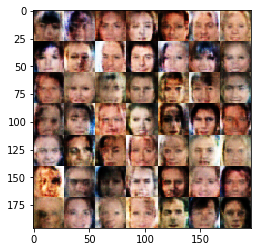

Epoch1/1 Steps2310 Discrimainator Loss: 1.7977 Generator Loss: 3.0963
Epoch1/1 Steps2320 Discrimainator Loss: 1.0467 Generator Loss: 0.8759
Epoch1/1 Steps2330 Discrimainator Loss: 0.8859 Generator Loss: 1.0315
Epoch1/1 Steps2340 Discrimainator Loss: 0.6657 Generator Loss: 1.2609
Epoch1/1 Steps2350 Discrimainator Loss: 0.6113 Generator Loss: 1.3748
Epoch1/1 Steps2360 Discrimainator Loss: 0.5869 Generator Loss: 1.2364
Epoch1/1 Steps2370 Discrimainator Loss: 0.8702 Generator Loss: 0.8149
Epoch1/1 Steps2380 Discrimainator Loss: 1.3875 Generator Loss: 0.3667
Epoch1/1 Steps2390 Discrimainator Loss: 0.9198 Generator Loss: 1.4716
Epoch1/1 Steps2400 Discrimainator Loss: 0.7621 Generator Loss: 1.6465


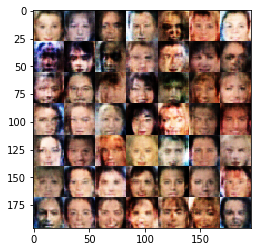

Epoch1/1 Steps2410 Discrimainator Loss: 1.2757 Generator Loss: 0.4855
Epoch1/1 Steps2420 Discrimainator Loss: 1.1501 Generator Loss: 2.1987
Epoch1/1 Steps2430 Discrimainator Loss: 0.9879 Generator Loss: 0.6394
Epoch1/1 Steps2440 Discrimainator Loss: 0.9187 Generator Loss: 0.7348
Epoch1/1 Steps2450 Discrimainator Loss: 0.8394 Generator Loss: 1.2681
Epoch1/1 Steps2460 Discrimainator Loss: 0.8634 Generator Loss: 1.6802
Epoch1/1 Steps2470 Discrimainator Loss: 1.3995 Generator Loss: 0.4373
Epoch1/1 Steps2480 Discrimainator Loss: 1.1178 Generator Loss: 0.5673
Epoch1/1 Steps2490 Discrimainator Loss: 1.6087 Generator Loss: 0.2783
Epoch1/1 Steps2500 Discrimainator Loss: 1.2040 Generator Loss: 0.4751


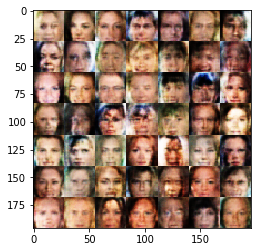

Epoch1/1 Steps2510 Discrimainator Loss: 1.0705 Generator Loss: 1.4049
Epoch1/1 Steps2520 Discrimainator Loss: 0.8308 Generator Loss: 0.9364
Epoch1/1 Steps2530 Discrimainator Loss: 1.4623 Generator Loss: 0.3191
Epoch1/1 Steps2540 Discrimainator Loss: 0.8040 Generator Loss: 0.9427
Epoch1/1 Steps2550 Discrimainator Loss: 0.8913 Generator Loss: 0.7333
Epoch1/1 Steps2560 Discrimainator Loss: 0.8329 Generator Loss: 0.9481
Epoch1/1 Steps2570 Discrimainator Loss: 0.7609 Generator Loss: 0.8932
Epoch1/1 Steps2580 Discrimainator Loss: 0.7509 Generator Loss: 1.0503
Epoch1/1 Steps2590 Discrimainator Loss: 1.2399 Generator Loss: 0.4124
Epoch1/1 Steps2600 Discrimainator Loss: 0.6488 Generator Loss: 1.5912


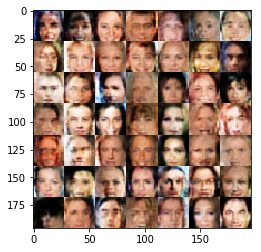

Epoch1/1 Steps2610 Discrimainator Loss: 0.8987 Generator Loss: 0.6950
Epoch1/1 Steps2620 Discrimainator Loss: 0.7158 Generator Loss: 1.2561
Epoch1/1 Steps2630 Discrimainator Loss: 0.5547 Generator Loss: 1.4259
Epoch1/1 Steps2640 Discrimainator Loss: 0.7327 Generator Loss: 1.4927
Epoch1/1 Steps2650 Discrimainator Loss: 0.7028 Generator Loss: 1.0318
Epoch1/1 Steps2660 Discrimainator Loss: 2.1036 Generator Loss: 0.1662
Epoch1/1 Steps2670 Discrimainator Loss: 0.8420 Generator Loss: 0.7611
Epoch1/1 Steps2680 Discrimainator Loss: 1.2685 Generator Loss: 0.4266
Epoch1/1 Steps2690 Discrimainator Loss: 0.6870 Generator Loss: 1.1034
Epoch1/1 Steps2700 Discrimainator Loss: 0.7651 Generator Loss: 0.7884


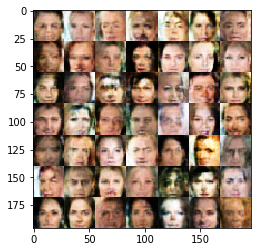

Epoch1/1 Steps2710 Discrimainator Loss: 1.7467 Generator Loss: 0.2349
Epoch1/1 Steps2720 Discrimainator Loss: 1.2537 Generator Loss: 0.4337
Epoch1/1 Steps2730 Discrimainator Loss: 0.8300 Generator Loss: 0.7761
Epoch1/1 Steps2740 Discrimainator Loss: 0.8793 Generator Loss: 0.9442
Epoch1/1 Steps2750 Discrimainator Loss: 0.7388 Generator Loss: 0.9453
Epoch1/1 Steps2760 Discrimainator Loss: 1.2334 Generator Loss: 0.4187
Epoch1/1 Steps2770 Discrimainator Loss: 1.0174 Generator Loss: 0.5712
Epoch1/1 Steps2780 Discrimainator Loss: 0.8883 Generator Loss: 1.2621
Epoch1/1 Steps2790 Discrimainator Loss: 1.0302 Generator Loss: 2.4787
Epoch1/1 Steps2800 Discrimainator Loss: 0.5556 Generator Loss: 1.2961


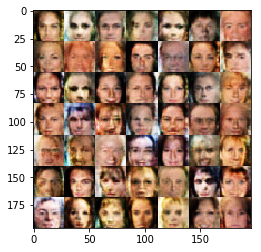

Epoch1/1 Steps2810 Discrimainator Loss: 1.9589 Generator Loss: 0.1829
Epoch1/1 Steps2820 Discrimainator Loss: 1.3127 Generator Loss: 0.3793
Epoch1/1 Steps2830 Discrimainator Loss: 1.2769 Generator Loss: 0.4474
Epoch1/1 Steps2840 Discrimainator Loss: 0.6580 Generator Loss: 0.9331
Epoch1/1 Steps2850 Discrimainator Loss: 0.5041 Generator Loss: 1.2423
Epoch1/1 Steps2860 Discrimainator Loss: 1.1884 Generator Loss: 2.1647
Epoch1/1 Steps2870 Discrimainator Loss: 0.5345 Generator Loss: 1.1706
Epoch1/1 Steps2880 Discrimainator Loss: 1.1673 Generator Loss: 0.4581
Epoch1/1 Steps2890 Discrimainator Loss: 1.0789 Generator Loss: 0.5032
Epoch1/1 Steps2900 Discrimainator Loss: 0.6965 Generator Loss: 1.2582


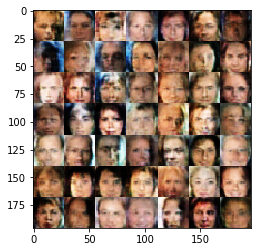

Epoch1/1 Steps2910 Discrimainator Loss: 1.0005 Generator Loss: 1.2637
Epoch1/1 Steps2920 Discrimainator Loss: 1.5859 Generator Loss: 0.2892
Epoch1/1 Steps2930 Discrimainator Loss: 0.8940 Generator Loss: 0.6799
Epoch1/1 Steps2940 Discrimainator Loss: 0.6185 Generator Loss: 1.0027
Epoch1/1 Steps2950 Discrimainator Loss: 0.6196 Generator Loss: 0.9856
Epoch1/1 Steps2960 Discrimainator Loss: 1.2911 Generator Loss: 0.3959
Epoch1/1 Steps2970 Discrimainator Loss: 2.6671 Generator Loss: 0.0905
Epoch1/1 Steps2980 Discrimainator Loss: 0.6237 Generator Loss: 1.0025
Epoch1/1 Steps2990 Discrimainator Loss: 1.1556 Generator Loss: 0.4802
Epoch1/1 Steps3000 Discrimainator Loss: 0.8546 Generator Loss: 0.8446


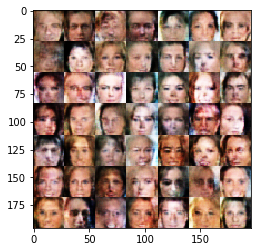

Epoch1/1 Steps3010 Discrimainator Loss: 0.6450 Generator Loss: 1.1770
Epoch1/1 Steps3020 Discrimainator Loss: 1.0586 Generator Loss: 0.5330
Epoch1/1 Steps3030 Discrimainator Loss: 0.6891 Generator Loss: 0.9346
Epoch1/1 Steps3040 Discrimainator Loss: 0.9417 Generator Loss: 0.6961
Epoch1/1 Steps3050 Discrimainator Loss: 0.5039 Generator Loss: 2.0072
Epoch1/1 Steps3060 Discrimainator Loss: 1.6157 Generator Loss: 1.9033
Epoch1/1 Steps3070 Discrimainator Loss: 1.4803 Generator Loss: 0.3218
Epoch1/1 Steps3080 Discrimainator Loss: 0.8800 Generator Loss: 0.7480
Epoch1/1 Steps3090 Discrimainator Loss: 0.9731 Generator Loss: 0.5930
Epoch1/1 Steps3100 Discrimainator Loss: 0.9726 Generator Loss: 0.6036


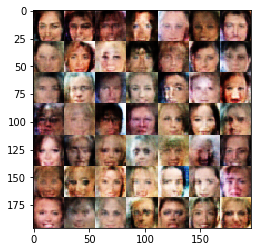

Epoch1/1 Steps3110 Discrimainator Loss: 1.3821 Generator Loss: 0.3364
Epoch1/1 Steps3120 Discrimainator Loss: 0.6558 Generator Loss: 1.0679
Epoch1/1 Steps3130 Discrimainator Loss: 1.6632 Generator Loss: 3.3560
Epoch1/1 Steps3140 Discrimainator Loss: 1.0531 Generator Loss: 0.5955
Epoch1/1 Steps3150 Discrimainator Loss: 0.8448 Generator Loss: 0.7920
Epoch1/1 Steps3160 Discrimainator Loss: 1.3288 Generator Loss: 0.4284
Epoch1/1 Steps3170 Discrimainator Loss: 0.7191 Generator Loss: 0.9736
Epoch1/1 Steps3180 Discrimainator Loss: 0.6357 Generator Loss: 1.1096
Epoch1/1 Steps3190 Discrimainator Loss: 0.9543 Generator Loss: 0.5954
Epoch1/1 Steps3200 Discrimainator Loss: 1.0279 Generator Loss: 0.6164


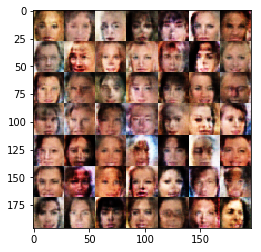

Epoch1/1 Steps3210 Discrimainator Loss: 1.2259 Generator Loss: 0.4267
Epoch1/1 Steps3220 Discrimainator Loss: 2.2837 Generator Loss: 0.1212
Epoch1/1 Steps3230 Discrimainator Loss: 1.2787 Generator Loss: 0.3895
Epoch1/1 Steps3240 Discrimainator Loss: 1.3879 Generator Loss: 0.3599
Epoch1/1 Steps3250 Discrimainator Loss: 2.1792 Generator Loss: 0.1418
Epoch1/1 Steps3260 Discrimainator Loss: 1.2711 Generator Loss: 0.4043
Epoch1/1 Steps3270 Discrimainator Loss: 0.6503 Generator Loss: 1.0138
Epoch1/1 Steps3280 Discrimainator Loss: 0.8302 Generator Loss: 0.7486
Epoch1/1 Steps3290 Discrimainator Loss: 1.2894 Generator Loss: 0.3980
Epoch1/1 Steps3300 Discrimainator Loss: 0.9069 Generator Loss: 0.6995


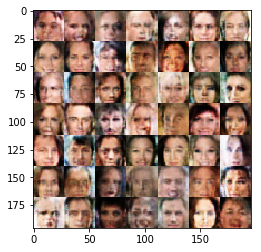

Epoch1/1 Steps3310 Discrimainator Loss: 0.9117 Generator Loss: 0.8167
Epoch1/1 Steps3320 Discrimainator Loss: 0.6270 Generator Loss: 1.0987
Epoch1/1 Steps3330 Discrimainator Loss: 0.8343 Generator Loss: 0.8596
Epoch1/1 Steps3340 Discrimainator Loss: 0.3718 Generator Loss: 1.7650
Epoch1/1 Steps3350 Discrimainator Loss: 0.8347 Generator Loss: 0.7222
Epoch1/1 Steps3360 Discrimainator Loss: 0.7028 Generator Loss: 0.9710
Epoch1/1 Steps3370 Discrimainator Loss: 0.7625 Generator Loss: 0.7977
Epoch1/1 Steps3380 Discrimainator Loss: 0.6002 Generator Loss: 1.0665
Epoch1/1 Steps3390 Discrimainator Loss: 1.4995 Generator Loss: 0.3124
Epoch1/1 Steps3400 Discrimainator Loss: 0.7087 Generator Loss: 0.9375


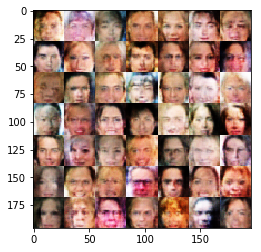

Epoch1/1 Steps3410 Discrimainator Loss: 0.4261 Generator Loss: 1.4754
Epoch1/1 Steps3420 Discrimainator Loss: 0.5517 Generator Loss: 1.9794
Epoch1/1 Steps3430 Discrimainator Loss: 1.7519 Generator Loss: 0.2432
Epoch1/1 Steps3440 Discrimainator Loss: 0.9015 Generator Loss: 1.0630
Epoch1/1 Steps3450 Discrimainator Loss: 0.9434 Generator Loss: 0.6702
Epoch1/1 Steps3460 Discrimainator Loss: 0.3711 Generator Loss: 1.8906
Epoch1/1 Steps3470 Discrimainator Loss: 0.9219 Generator Loss: 0.6610
Epoch1/1 Steps3480 Discrimainator Loss: 0.4109 Generator Loss: 1.5491
Epoch1/1 Steps3490 Discrimainator Loss: 0.4169 Generator Loss: 2.2178
Epoch1/1 Steps3500 Discrimainator Loss: 2.3412 Generator Loss: 2.7272


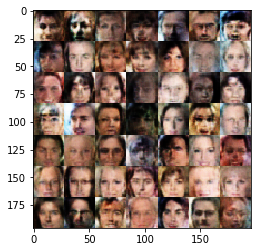

Epoch1/1 Steps3510 Discrimainator Loss: 0.8974 Generator Loss: 0.6740
Epoch1/1 Steps3520 Discrimainator Loss: 0.5527 Generator Loss: 1.3586
Epoch1/1 Steps3530 Discrimainator Loss: 0.7551 Generator Loss: 0.9574
Epoch1/1 Steps3540 Discrimainator Loss: 0.6324 Generator Loss: 1.2975
Epoch1/1 Steps3550 Discrimainator Loss: 1.3130 Generator Loss: 2.8165
Epoch1/1 Steps3560 Discrimainator Loss: 0.5039 Generator Loss: 1.3680
Epoch1/1 Steps3570 Discrimainator Loss: 1.0690 Generator Loss: 0.5520
Epoch1/1 Steps3580 Discrimainator Loss: 0.8408 Generator Loss: 1.2666
Epoch1/1 Steps3590 Discrimainator Loss: 1.1547 Generator Loss: 0.4954
Epoch1/1 Steps3600 Discrimainator Loss: 0.7365 Generator Loss: 1.2126


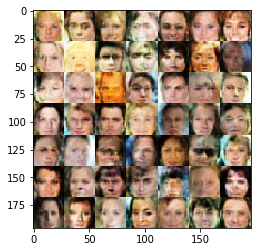

Epoch1/1 Steps3610 Discrimainator Loss: 0.7781 Generator Loss: 0.9261
Epoch1/1 Steps3620 Discrimainator Loss: 0.7593 Generator Loss: 1.0811
Epoch1/1 Steps3630 Discrimainator Loss: 0.6766 Generator Loss: 0.9346
Epoch1/1 Steps3640 Discrimainator Loss: 0.7785 Generator Loss: 0.7580
Epoch1/1 Steps3650 Discrimainator Loss: 0.5531 Generator Loss: 1.1686
Epoch1/1 Steps3660 Discrimainator Loss: 3.7910 Generator Loss: 4.6969
Epoch1/1 Steps3670 Discrimainator Loss: 1.0551 Generator Loss: 0.5699
Epoch1/1 Steps3680 Discrimainator Loss: 0.3900 Generator Loss: 1.7143
Epoch1/1 Steps3690 Discrimainator Loss: 0.4453 Generator Loss: 1.4533
Epoch1/1 Steps3700 Discrimainator Loss: 1.0080 Generator Loss: 0.5380


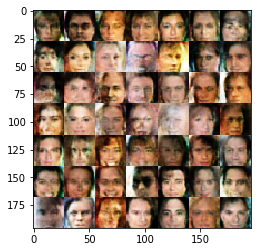

Epoch1/1 Steps3710 Discrimainator Loss: 1.2087 Generator Loss: 0.4389
Epoch1/1 Steps3720 Discrimainator Loss: 0.9432 Generator Loss: 0.6795
Epoch1/1 Steps3730 Discrimainator Loss: 0.4611 Generator Loss: 1.3786
Epoch1/1 Steps3740 Discrimainator Loss: 0.6874 Generator Loss: 0.9561
Epoch1/1 Steps3750 Discrimainator Loss: 0.6193 Generator Loss: 1.0141
Epoch1/1 Steps3760 Discrimainator Loss: 1.8119 Generator Loss: 0.2128
Epoch1/1 Steps3770 Discrimainator Loss: 0.5583 Generator Loss: 1.1575
Epoch1/1 Steps3780 Discrimainator Loss: 0.5552 Generator Loss: 1.3551
Epoch1/1 Steps3790 Discrimainator Loss: 1.7033 Generator Loss: 0.3036
Epoch1/1 Steps3800 Discrimainator Loss: 0.7286 Generator Loss: 0.9257


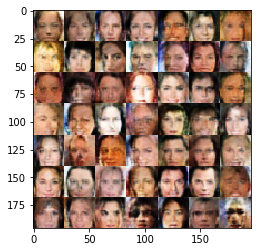

Epoch1/1 Steps3810 Discrimainator Loss: 0.7349 Generator Loss: 0.8123
Epoch1/1 Steps3820 Discrimainator Loss: 1.5091 Generator Loss: 0.3075
Epoch1/1 Steps3830 Discrimainator Loss: 0.5178 Generator Loss: 1.5764
Epoch1/1 Steps3840 Discrimainator Loss: 1.1280 Generator Loss: 0.5153
Epoch1/1 Steps3850 Discrimainator Loss: 0.6397 Generator Loss: 0.9713
Epoch1/1 Steps3860 Discrimainator Loss: 1.8337 Generator Loss: 0.2274
Epoch1/1 Steps3870 Discrimainator Loss: 0.7524 Generator Loss: 1.5101
Epoch1/1 Steps3880 Discrimainator Loss: 0.3657 Generator Loss: 2.2543
Epoch1/1 Steps3890 Discrimainator Loss: 1.4338 Generator Loss: 0.3321
Epoch1/1 Steps3900 Discrimainator Loss: 1.0282 Generator Loss: 0.5964


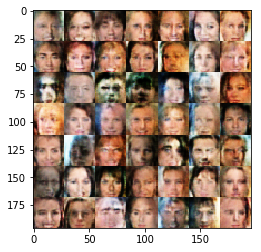

Epoch1/1 Steps3910 Discrimainator Loss: 0.8757 Generator Loss: 0.6908
Epoch1/1 Steps3920 Discrimainator Loss: 0.8459 Generator Loss: 0.7260
Epoch1/1 Steps3930 Discrimainator Loss: 1.9490 Generator Loss: 0.1831
Epoch1/1 Steps3940 Discrimainator Loss: 0.4388 Generator Loss: 1.7740
Epoch1/1 Steps3950 Discrimainator Loss: 0.7969 Generator Loss: 0.7679
Epoch1/1 Steps3960 Discrimainator Loss: 0.4214 Generator Loss: 1.5949
Epoch1/1 Steps3970 Discrimainator Loss: 1.5216 Generator Loss: 0.2895
Epoch1/1 Steps3980 Discrimainator Loss: 0.6308 Generator Loss: 1.0823
Epoch1/1 Steps3990 Discrimainator Loss: 0.5212 Generator Loss: 1.3867
Epoch1/1 Steps4000 Discrimainator Loss: 0.4242 Generator Loss: 1.4978


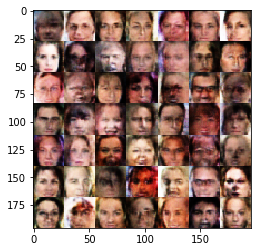

Epoch1/1 Steps4010 Discrimainator Loss: 0.9529 Generator Loss: 0.6218
Epoch1/1 Steps4020 Discrimainator Loss: 0.8532 Generator Loss: 0.9401
Epoch1/1 Steps4030 Discrimainator Loss: 1.1820 Generator Loss: 1.5390
Epoch1/1 Steps4040 Discrimainator Loss: 1.2638 Generator Loss: 0.3903
Epoch1/1 Steps4050 Discrimainator Loss: 0.6110 Generator Loss: 1.2615
Epoch1/1 Steps4060 Discrimainator Loss: 0.7265 Generator Loss: 0.8564
Epoch1/1 Steps4070 Discrimainator Loss: 0.2939 Generator Loss: 1.8314
Epoch1/1 Steps4080 Discrimainator Loss: 0.4845 Generator Loss: 1.7994
Epoch1/1 Steps4090 Discrimainator Loss: 0.8125 Generator Loss: 0.8171
Epoch1/1 Steps4100 Discrimainator Loss: 0.8499 Generator Loss: 0.7078


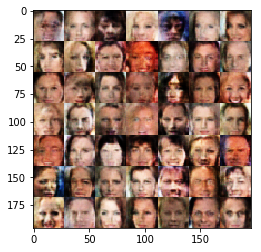

Epoch1/1 Steps4110 Discrimainator Loss: 0.5220 Generator Loss: 1.6279
Epoch1/1 Steps4120 Discrimainator Loss: 1.1526 Generator Loss: 0.5147
Epoch1/1 Steps4130 Discrimainator Loss: 0.5214 Generator Loss: 1.1234
Epoch1/1 Steps4140 Discrimainator Loss: 0.6728 Generator Loss: 0.9681
Epoch1/1 Steps4150 Discrimainator Loss: 2.4915 Generator Loss: 0.0967
Epoch1/1 Steps4160 Discrimainator Loss: 1.6387 Generator Loss: 0.2858
Epoch1/1 Steps4170 Discrimainator Loss: 0.5595 Generator Loss: 1.0108
Epoch1/1 Steps4180 Discrimainator Loss: 0.4505 Generator Loss: 1.3329
Epoch1/1 Steps4190 Discrimainator Loss: 0.4657 Generator Loss: 1.7743
Epoch1/1 Steps4200 Discrimainator Loss: 0.4038 Generator Loss: 1.4104


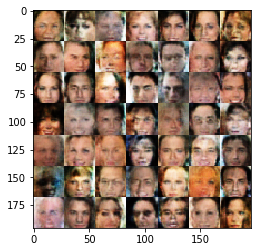

Epoch1/1 Steps4210 Discrimainator Loss: 0.9948 Generator Loss: 1.1939
Epoch1/1 Steps4220 Discrimainator Loss: 0.6315 Generator Loss: 1.2838
Epoch1/1 Steps4230 Discrimainator Loss: 1.0688 Generator Loss: 0.5080
Epoch1/1 Steps4240 Discrimainator Loss: 0.7818 Generator Loss: 1.7969
Epoch1/1 Steps4250 Discrimainator Loss: 0.6296 Generator Loss: 1.0793
Epoch1/1 Steps4260 Discrimainator Loss: 0.4339 Generator Loss: 1.2385
Epoch1/1 Steps4270 Discrimainator Loss: 0.6188 Generator Loss: 1.1702
Epoch1/1 Steps4280 Discrimainator Loss: 1.8162 Generator Loss: 0.2208
Epoch1/1 Steps4290 Discrimainator Loss: 1.0772 Generator Loss: 0.4846
Epoch1/1 Steps4300 Discrimainator Loss: 0.5636 Generator Loss: 1.0743


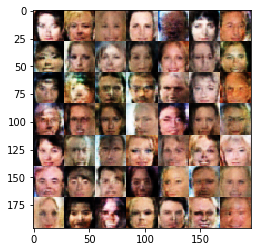

Epoch1/1 Steps4310 Discrimainator Loss: 0.5101 Generator Loss: 1.5038
Epoch1/1 Steps4320 Discrimainator Loss: 1.0185 Generator Loss: 0.5070
Epoch1/1 Steps4330 Discrimainator Loss: 0.8367 Generator Loss: 0.6975
Epoch1/1 Steps4340 Discrimainator Loss: 0.6147 Generator Loss: 0.9987
Epoch1/1 Steps4350 Discrimainator Loss: 0.7463 Generator Loss: 0.8246
Epoch1/1 Steps4360 Discrimainator Loss: 0.5452 Generator Loss: 1.5744
Epoch1/1 Steps4370 Discrimainator Loss: 0.7776 Generator Loss: 2.2818
Epoch1/1 Steps4380 Discrimainator Loss: 1.9389 Generator Loss: 2.4518
Epoch1/1 Steps4390 Discrimainator Loss: 0.6176 Generator Loss: 1.0283
Epoch1/1 Steps4400 Discrimainator Loss: 0.4395 Generator Loss: 1.5172


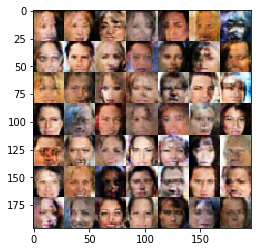

Epoch1/1 Steps4410 Discrimainator Loss: 1.6613 Generator Loss: 0.2642
Epoch1/1 Steps4420 Discrimainator Loss: 0.4930 Generator Loss: 1.6081
Epoch1/1 Steps4430 Discrimainator Loss: 0.5076 Generator Loss: 1.9083
Epoch1/1 Steps4440 Discrimainator Loss: 0.3126 Generator Loss: 1.6705
Epoch1/1 Steps4450 Discrimainator Loss: 1.4940 Generator Loss: 0.3202
Epoch1/1 Steps4460 Discrimainator Loss: 1.1602 Generator Loss: 0.4969
Epoch1/1 Steps4470 Discrimainator Loss: 0.7664 Generator Loss: 0.9010
Epoch1/1 Steps4480 Discrimainator Loss: 0.9063 Generator Loss: 0.6268
Epoch1/1 Steps4490 Discrimainator Loss: 0.3236 Generator Loss: 2.0282
Epoch1/1 Steps4500 Discrimainator Loss: 0.5573 Generator Loss: 1.0856


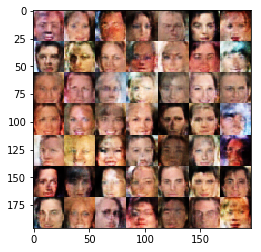

Epoch1/1 Steps4510 Discrimainator Loss: 0.5514 Generator Loss: 1.2995
Epoch1/1 Steps4520 Discrimainator Loss: 0.7603 Generator Loss: 0.8197
Epoch1/1 Steps4530 Discrimainator Loss: 1.8293 Generator Loss: 0.2195
Epoch1/1 Steps4540 Discrimainator Loss: 0.4977 Generator Loss: 1.3680
Epoch1/1 Steps4550 Discrimainator Loss: 0.7121 Generator Loss: 0.8574
Epoch1/1 Steps4560 Discrimainator Loss: 0.7428 Generator Loss: 0.9489
Epoch1/1 Steps4570 Discrimainator Loss: 0.6685 Generator Loss: 2.2603
Epoch1/1 Steps4580 Discrimainator Loss: 0.4094 Generator Loss: 1.6296
Epoch1/1 Steps4590 Discrimainator Loss: 0.4214 Generator Loss: 1.4343
Epoch1/1 Steps4600 Discrimainator Loss: 0.6233 Generator Loss: 1.0883


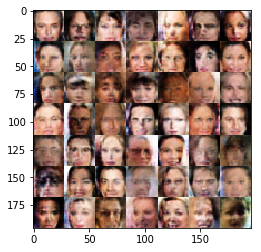

Epoch1/1 Steps4610 Discrimainator Loss: 0.4348 Generator Loss: 2.2785
Epoch1/1 Steps4620 Discrimainator Loss: 1.5861 Generator Loss: 2.6034
Epoch1/1 Steps4630 Discrimainator Loss: 0.8351 Generator Loss: 2.8884
Epoch1/1 Steps4640 Discrimainator Loss: 1.0191 Generator Loss: 0.5390
Epoch1/1 Steps4650 Discrimainator Loss: 0.8299 Generator Loss: 0.6913
Epoch1/1 Steps4660 Discrimainator Loss: 0.6508 Generator Loss: 0.9770
Epoch1/1 Steps4670 Discrimainator Loss: 0.3198 Generator Loss: 1.7132
Epoch1/1 Steps4680 Discrimainator Loss: 2.1839 Generator Loss: 0.1456
Epoch1/1 Steps4690 Discrimainator Loss: 0.7741 Generator Loss: 0.9344
Epoch1/1 Steps4700 Discrimainator Loss: 0.5891 Generator Loss: 1.1124


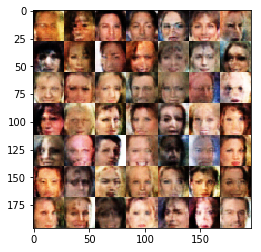

Epoch1/1 Steps4710 Discrimainator Loss: 1.7427 Generator Loss: 0.2534
Epoch1/1 Steps4720 Discrimainator Loss: 0.4949 Generator Loss: 1.1970
Epoch1/1 Steps4730 Discrimainator Loss: 0.4676 Generator Loss: 1.3575
Epoch1/1 Steps4740 Discrimainator Loss: 0.9348 Generator Loss: 0.8066
Epoch1/1 Steps4750 Discrimainator Loss: 0.7057 Generator Loss: 0.8414
Epoch1/1 Steps4760 Discrimainator Loss: 0.4738 Generator Loss: 1.2787
Epoch1/1 Steps4770 Discrimainator Loss: 0.3847 Generator Loss: 1.6314
Epoch1/1 Steps4780 Discrimainator Loss: 0.4819 Generator Loss: 1.2261
Epoch1/1 Steps4790 Discrimainator Loss: 0.8810 Generator Loss: 0.6626
Epoch1/1 Steps4800 Discrimainator Loss: 0.5435 Generator Loss: 1.6180


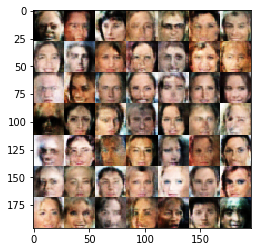

Epoch1/1 Steps4810 Discrimainator Loss: 0.6301 Generator Loss: 0.9300
Epoch1/1 Steps4820 Discrimainator Loss: 1.8643 Generator Loss: 0.2281
Epoch1/1 Steps4830 Discrimainator Loss: 0.7700 Generator Loss: 0.7805
Epoch1/1 Steps4840 Discrimainator Loss: 0.4079 Generator Loss: 1.4404
Epoch1/1 Steps4850 Discrimainator Loss: 0.5705 Generator Loss: 0.9975
Epoch1/1 Steps4860 Discrimainator Loss: 0.4378 Generator Loss: 1.5863
Epoch1/1 Steps4870 Discrimainator Loss: 1.0898 Generator Loss: 0.5008
Epoch1/1 Steps4880 Discrimainator Loss: 0.7672 Generator Loss: 0.7458
Epoch1/1 Steps4890 Discrimainator Loss: 2.5120 Generator Loss: 0.1205
Epoch1/1 Steps4900 Discrimainator Loss: 1.7313 Generator Loss: 0.2798


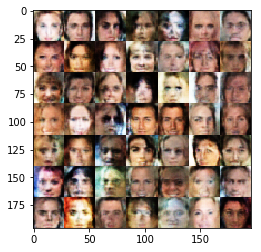

Epoch1/1 Steps4910 Discrimainator Loss: 0.9607 Generator Loss: 0.6825
Epoch1/1 Steps4920 Discrimainator Loss: 0.6321 Generator Loss: 1.4573
Epoch1/1 Steps4930 Discrimainator Loss: 0.6662 Generator Loss: 0.9587
Epoch1/1 Steps4940 Discrimainator Loss: 0.8760 Generator Loss: 0.6806
Epoch1/1 Steps4950 Discrimainator Loss: 1.4013 Generator Loss: 0.3342
Epoch1/1 Steps4960 Discrimainator Loss: 0.6835 Generator Loss: 0.9275
Epoch1/1 Steps4970 Discrimainator Loss: 0.7617 Generator Loss: 0.7898
Epoch1/1 Steps4980 Discrimainator Loss: 0.9848 Generator Loss: 0.6141
Epoch1/1 Steps4990 Discrimainator Loss: 0.7592 Generator Loss: 0.7994
Epoch1/1 Steps5000 Discrimainator Loss: 0.9238 Generator Loss: 0.6868


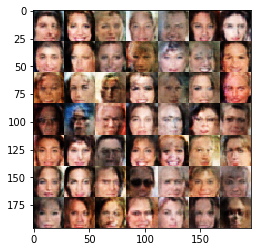

Epoch1/1 Steps5010 Discrimainator Loss: 0.5273 Generator Loss: 1.1984
Epoch1/1 Steps5020 Discrimainator Loss: 0.4538 Generator Loss: 1.3976
Epoch1/1 Steps5030 Discrimainator Loss: 0.3085 Generator Loss: 1.7138
Epoch1/1 Steps5040 Discrimainator Loss: 0.2518 Generator Loss: 2.0025
Epoch1/1 Steps5050 Discrimainator Loss: 0.6279 Generator Loss: 2.1666
Epoch1/1 Steps5060 Discrimainator Loss: 0.6919 Generator Loss: 0.8784
Epoch1/1 Steps5070 Discrimainator Loss: 0.5413 Generator Loss: 1.1090
Epoch1/1 Steps5080 Discrimainator Loss: 1.6426 Generator Loss: 0.2655
Epoch1/1 Steps5090 Discrimainator Loss: 0.4661 Generator Loss: 1.2801
Epoch1/1 Steps5100 Discrimainator Loss: 0.5874 Generator Loss: 1.0027


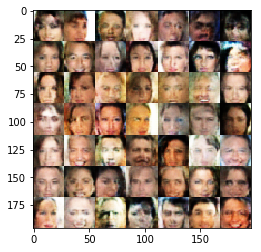

Epoch1/1 Steps5110 Discrimainator Loss: 1.1658 Generator Loss: 0.4743
Epoch1/1 Steps5120 Discrimainator Loss: 1.4326 Generator Loss: 0.3454
Epoch1/1 Steps5130 Discrimainator Loss: 1.0648 Generator Loss: 0.5433
Epoch1/1 Steps5140 Discrimainator Loss: 0.3778 Generator Loss: 1.6377
Epoch1/1 Steps5150 Discrimainator Loss: 0.3790 Generator Loss: 1.5686
Epoch1/1 Steps5160 Discrimainator Loss: 0.6929 Generator Loss: 1.0288
Epoch1/1 Steps5170 Discrimainator Loss: 0.3778 Generator Loss: 1.6467
Epoch1/1 Steps5180 Discrimainator Loss: 0.5124 Generator Loss: 1.3908
Epoch1/1 Steps5190 Discrimainator Loss: 0.5644 Generator Loss: 1.1476
Epoch1/1 Steps5200 Discrimainator Loss: 0.3356 Generator Loss: 1.6940


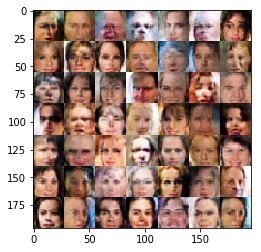

Epoch1/1 Steps5210 Discrimainator Loss: 0.4699 Generator Loss: 1.3445
Epoch1/1 Steps5220 Discrimainator Loss: 0.5603 Generator Loss: 1.5290
Epoch1/1 Steps5230 Discrimainator Loss: 1.1371 Generator Loss: 0.7087
Epoch1/1 Steps5240 Discrimainator Loss: 0.8145 Generator Loss: 0.7718
Epoch1/1 Steps5250 Discrimainator Loss: 1.2253 Generator Loss: 0.4591
Epoch1/1 Steps5260 Discrimainator Loss: 1.0077 Generator Loss: 0.5879
Epoch1/1 Steps5270 Discrimainator Loss: 0.6995 Generator Loss: 0.8966
Epoch1/1 Steps5280 Discrimainator Loss: 0.9650 Generator Loss: 2.4344
Epoch1/1 Steps5290 Discrimainator Loss: 0.7076 Generator Loss: 1.5416
Epoch1/1 Steps5300 Discrimainator Loss: 0.8025 Generator Loss: 0.7059


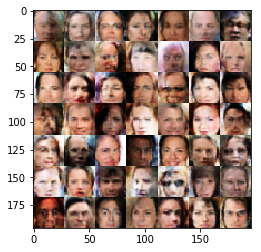

Epoch1/1 Steps5310 Discrimainator Loss: 0.6772 Generator Loss: 1.0324
Epoch1/1 Steps5320 Discrimainator Loss: 0.6499 Generator Loss: 1.0181
Epoch1/1 Steps5330 Discrimainator Loss: 0.7540 Generator Loss: 0.7959
Epoch1/1 Steps5340 Discrimainator Loss: 0.5508 Generator Loss: 1.0891
Epoch1/1 Steps5350 Discrimainator Loss: 1.0397 Generator Loss: 0.5353
Epoch1/1 Steps5360 Discrimainator Loss: 0.7042 Generator Loss: 0.9521
Epoch1/1 Steps5370 Discrimainator Loss: 0.3962 Generator Loss: 1.8387
Epoch1/1 Steps5380 Discrimainator Loss: 1.2449 Generator Loss: 0.4350
Epoch1/1 Steps5390 Discrimainator Loss: 0.3468 Generator Loss: 1.8351
Epoch1/1 Steps5400 Discrimainator Loss: 0.9659 Generator Loss: 0.8320


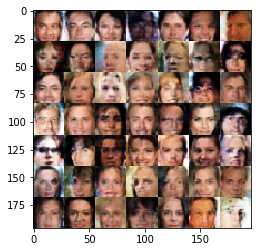

Epoch1/1 Steps5410 Discrimainator Loss: 0.8526 Generator Loss: 0.7437
Epoch1/1 Steps5420 Discrimainator Loss: 0.4136 Generator Loss: 1.6283
Epoch1/1 Steps5430 Discrimainator Loss: 0.5281 Generator Loss: 1.2353
Epoch1/1 Steps5440 Discrimainator Loss: 0.1703 Generator Loss: 2.4452
Epoch1/1 Steps5450 Discrimainator Loss: 0.4920 Generator Loss: 2.6204
Epoch1/1 Steps5460 Discrimainator Loss: 1.6498 Generator Loss: 2.8385
Epoch1/1 Steps5470 Discrimainator Loss: 1.1342 Generator Loss: 0.5500
Epoch1/1 Steps5480 Discrimainator Loss: 0.4201 Generator Loss: 1.4252
Epoch1/1 Steps5490 Discrimainator Loss: 0.8036 Generator Loss: 0.7714
Epoch1/1 Steps5500 Discrimainator Loss: 0.8847 Generator Loss: 0.6721


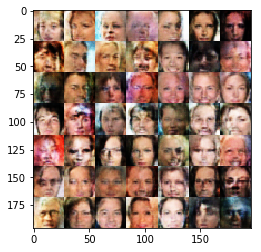

Epoch1/1 Steps5510 Discrimainator Loss: 0.5535 Generator Loss: 1.1641
Epoch1/1 Steps5520 Discrimainator Loss: 0.7680 Generator Loss: 0.8532
Epoch1/1 Steps5530 Discrimainator Loss: 1.4344 Generator Loss: 0.3337
Epoch1/1 Steps5540 Discrimainator Loss: 1.2914 Generator Loss: 0.4401
Epoch1/1 Steps5550 Discrimainator Loss: 0.7358 Generator Loss: 0.8449
Epoch1/1 Steps5560 Discrimainator Loss: 0.6075 Generator Loss: 1.6685
Epoch1/1 Steps5570 Discrimainator Loss: 0.7236 Generator Loss: 1.0667
Epoch1/1 Steps5580 Discrimainator Loss: 0.6798 Generator Loss: 0.9198
Epoch1/1 Steps5590 Discrimainator Loss: 0.7709 Generator Loss: 0.7878
Epoch1/1 Steps5600 Discrimainator Loss: 0.4798 Generator Loss: 1.9124


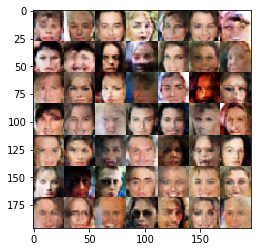

Epoch1/1 Steps5610 Discrimainator Loss: 0.4202 Generator Loss: 1.5300
Epoch1/1 Steps5620 Discrimainator Loss: 0.3971 Generator Loss: 1.6086
Epoch1/1 Steps5630 Discrimainator Loss: 0.4110 Generator Loss: 2.3223
Epoch1/1 Steps5640 Discrimainator Loss: 0.9433 Generator Loss: 2.3757
Epoch1/1 Steps5650 Discrimainator Loss: 0.6131 Generator Loss: 1.3985
Epoch1/1 Steps5660 Discrimainator Loss: 0.9614 Generator Loss: 0.6041
Epoch1/1 Steps5670 Discrimainator Loss: 0.6009 Generator Loss: 1.1010
Epoch1/1 Steps5680 Discrimainator Loss: 0.3709 Generator Loss: 1.7973
Epoch1/1 Steps5690 Discrimainator Loss: 0.8847 Generator Loss: 0.7005
Epoch1/1 Steps5700 Discrimainator Loss: 0.8362 Generator Loss: 0.7751


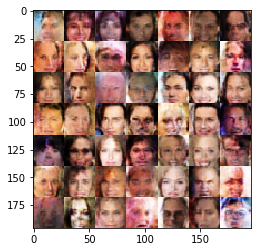

Epoch1/1 Steps5710 Discrimainator Loss: 0.5245 Generator Loss: 1.2595
Epoch1/1 Steps5720 Discrimainator Loss: 0.7582 Generator Loss: 0.7538
Epoch1/1 Steps5730 Discrimainator Loss: 0.4693 Generator Loss: 1.1642
Epoch1/1 Steps5740 Discrimainator Loss: 1.4592 Generator Loss: 0.3356
Epoch1/1 Steps5750 Discrimainator Loss: 1.4740 Generator Loss: 0.3105
Epoch1/1 Steps5760 Discrimainator Loss: 0.2577 Generator Loss: 2.6747
Epoch1/1 Steps5770 Discrimainator Loss: 0.5644 Generator Loss: 1.6293
Epoch1/1 Steps5780 Discrimainator Loss: 0.7710 Generator Loss: 0.8464
Epoch1/1 Steps5790 Discrimainator Loss: 1.6837 Generator Loss: 0.2452
Epoch1/1 Steps5800 Discrimainator Loss: 0.6762 Generator Loss: 0.8810


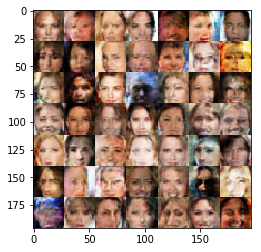

Epoch1/1 Steps5810 Discrimainator Loss: 0.6124 Generator Loss: 1.2184
Epoch1/1 Steps5820 Discrimainator Loss: 0.4672 Generator Loss: 1.3464
Epoch1/1 Steps5830 Discrimainator Loss: 0.6100 Generator Loss: 1.5984
Epoch1/1 Steps5840 Discrimainator Loss: 0.4303 Generator Loss: 3.0572
Epoch1/1 Steps5850 Discrimainator Loss: 1.0477 Generator Loss: 0.5524
Epoch1/1 Steps5860 Discrimainator Loss: 0.9905 Generator Loss: 0.7050
Epoch1/1 Steps5870 Discrimainator Loss: 1.1539 Generator Loss: 0.4545
Epoch1/1 Steps5880 Discrimainator Loss: 0.8672 Generator Loss: 0.6885
Epoch1/1 Steps5890 Discrimainator Loss: 0.8689 Generator Loss: 0.7173
Epoch1/1 Steps5900 Discrimainator Loss: 0.7229 Generator Loss: 1.4275


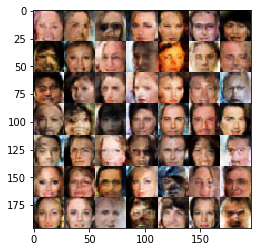

Epoch1/1 Steps5910 Discrimainator Loss: 0.6184 Generator Loss: 1.0996
Epoch1/1 Steps5920 Discrimainator Loss: 0.7982 Generator Loss: 0.7936
Epoch1/1 Steps5930 Discrimainator Loss: 1.0659 Generator Loss: 0.5566
Epoch1/1 Steps5940 Discrimainator Loss: 0.7737 Generator Loss: 0.8491
Epoch1/1 Steps5950 Discrimainator Loss: 0.6565 Generator Loss: 1.0297
Epoch1/1 Steps5960 Discrimainator Loss: 1.0826 Generator Loss: 2.4082
Epoch1/1 Steps5970 Discrimainator Loss: 0.5749 Generator Loss: 1.5887
Epoch1/1 Steps5980 Discrimainator Loss: 0.3569 Generator Loss: 1.6898
Epoch1/1 Steps5990 Discrimainator Loss: 0.7475 Generator Loss: 0.8166
Epoch1/1 Steps6000 Discrimainator Loss: 0.4791 Generator Loss: 1.3289


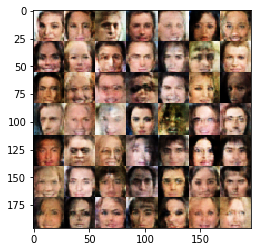

Epoch1/1 Steps6010 Discrimainator Loss: 1.4865 Generator Loss: 2.4408
Epoch1/1 Steps6020 Discrimainator Loss: 1.5098 Generator Loss: 0.3062
Epoch1/1 Steps6030 Discrimainator Loss: 0.5056 Generator Loss: 1.2618
Epoch1/1 Steps6040 Discrimainator Loss: 0.4118 Generator Loss: 1.4764
Epoch1/1 Steps6050 Discrimainator Loss: 0.4249 Generator Loss: 1.4651
Epoch1/1 Steps6060 Discrimainator Loss: 0.4536 Generator Loss: 1.3535
Epoch1/1 Steps6070 Discrimainator Loss: 0.6493 Generator Loss: 0.9654
Epoch1/1 Steps6080 Discrimainator Loss: 0.4094 Generator Loss: 1.3614
Epoch1/1 Steps6090 Discrimainator Loss: 0.9683 Generator Loss: 0.5746
Epoch1/1 Steps6100 Discrimainator Loss: 0.8573 Generator Loss: 0.7209


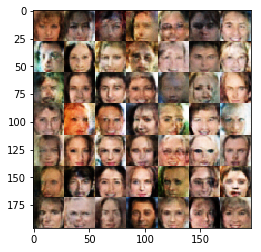

Epoch1/1 Steps6110 Discrimainator Loss: 1.5101 Generator Loss: 0.2941
Epoch1/1 Steps6120 Discrimainator Loss: 0.4395 Generator Loss: 1.6109
Epoch1/1 Steps6130 Discrimainator Loss: 1.4906 Generator Loss: 0.3061
Epoch1/1 Steps6140 Discrimainator Loss: 0.6657 Generator Loss: 0.9510
Epoch1/1 Steps6150 Discrimainator Loss: 0.6158 Generator Loss: 1.0297
Epoch1/1 Steps6160 Discrimainator Loss: 0.5534 Generator Loss: 1.1402
Epoch1/1 Steps6170 Discrimainator Loss: 0.9966 Generator Loss: 0.5469
Epoch1/1 Steps6180 Discrimainator Loss: 1.1783 Generator Loss: 0.4437
Epoch1/1 Steps6190 Discrimainator Loss: 0.4922 Generator Loss: 1.1820
Epoch1/1 Steps6200 Discrimainator Loss: 0.6075 Generator Loss: 0.9864


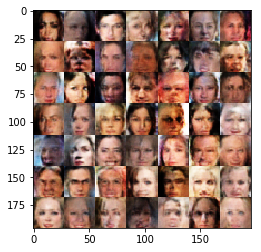

Epoch1/1 Steps6210 Discrimainator Loss: 1.6156 Generator Loss: 3.3211
Epoch1/1 Steps6220 Discrimainator Loss: 0.5925 Generator Loss: 0.9879
Epoch1/1 Steps6230 Discrimainator Loss: 0.6135 Generator Loss: 1.0457
Epoch1/1 Steps6240 Discrimainator Loss: 1.2596 Generator Loss: 4.9857
Epoch1/1 Steps6250 Discrimainator Loss: 0.9782 Generator Loss: 0.5940
Epoch1/1 Steps6260 Discrimainator Loss: 0.6501 Generator Loss: 1.1803
Epoch1/1 Steps6270 Discrimainator Loss: 0.6695 Generator Loss: 0.9062
Epoch1/1 Steps6280 Discrimainator Loss: 1.2544 Generator Loss: 0.4065
Epoch1/1 Steps6290 Discrimainator Loss: 0.9451 Generator Loss: 0.6073
Epoch1/1 Steps6300 Discrimainator Loss: 0.8668 Generator Loss: 0.6869


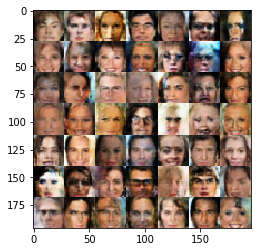

Epoch1/1 Steps6310 Discrimainator Loss: 0.4769 Generator Loss: 1.6008
Epoch1/1 Steps6320 Discrimainator Loss: 0.5663 Generator Loss: 0.9909
Epoch1/1 Steps6330 Discrimainator Loss: 1.2822 Generator Loss: 3.5853


In [17]:
batch_size = 32
z_dim = 128
learning_rate = 0.0001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。